<a href="https://colab.research.google.com/github/KalyankumarKonduru/EventManagement/blob/main/Apparel_AI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Load the Drive helper and mount
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Code 1

In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import transforms
from PIL import Image
import matplotlib.pyplot as plt

# Dataset for clothing, model, and background images
class FashionDataset(Dataset):
    def __init__(self, clothing_dir, model_dir, background_dir, transform=None):
        self.clothing_images = sorted(os.listdir(clothing_dir))
        self.model_images = sorted(os.listdir(model_dir))
        self.background_images = sorted(os.listdir(background_dir))
        self.clothing_dir = clothing_dir
        self.model_dir = model_dir
        self.background_dir = background_dir
        self.transform = transform

    def __len__(self):
        return len(self.clothing_images)

    def __getitem__(self, idx):
        print("FashionDataset")
        clothing = Image.open(os.path.join(self.clothing_dir, self.clothing_images[idx])).convert("RGB")
        model = Image.open(os.path.join(self.model_dir, self.model_images[idx % len(self.model_images)])).convert("RGB")
        background = Image.open(os.path.join(self.background_dir, self.background_images[idx % len(self.background_images)])).convert("RGB")

        if self.transform:
            clothing = self.transform(clothing)
            model = self.transform(model)
            background = self.transform(background)

        return clothing, model, background

# Generator (Pix2Pix architecture)
class GeneratorUNet(nn.Module):
    def __init__(self):
        super(GeneratorUNet, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(6, 64, kernel_size=4, stride=2, padding=1),  # Concatenated input channels (clothing + model)
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1),
            nn.Tanh(),
        )

    def forward(self, x):
        print("# GeneratorUNet forward")
        x = self.encoder(x)
        x = self.decoder(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(9, 64, kernel_size=4, stride=2, padding=1),  # Input channels: clothing + model + background
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 1, kernel_size=4, stride=1, padding=0),
        )
        self.final_layer = nn.Sequential(
            nn.Sigmoid(),  # Ensures output values are between 0 and 1
            nn.AdaptiveAvgPool2d((14, 14))  # Ensures the output size matches the labels
        )

    def forward(self, x):
        x = self.model(x)
        return self.final_layer(x)


def train_gan(generator, discriminator, dataloader, num_epochs, device):
    criterion = nn.BCELoss()
    optimizer_G = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
    optimizer_D = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

    for epoch in range(num_epochs):
        for i, (clothing, model, background) in enumerate(dataloader):
            batch_size = clothing.size(0)
            clothing, model, background = clothing.to(device), model.to(device), background.to(device)

            # Prepare inputs and labels
            real_images = torch.cat([model, background], 1).to(device)  # Combine model and background (6 channels)
            real_combined = torch.cat([clothing, real_images], 1)  # Combine clothing (3 channels) + real images (6 channels) = 9 channels
            fake_images = generator(torch.cat([clothing, model], 1))  # Combine clothing (3 channels) + model (3 channels) = 6 channels
            fake_combined = torch.cat([clothing, fake_images], 1)  # Combine clothing + fake images

            real_labels = torch.ones((batch_size, 1, 14, 14), device=device)
            fake_labels = torch.zeros((batch_size, 1, 14, 14), device=device)

            # Train Discriminator
            discriminator.zero_grad()
            real_loss = criterion(discriminator(real_combined), real_labels)  # Pass real_combined
            fake_loss = criterion(discriminator(fake_combined.detach()), fake_labels)  # Pass fake_combined
            d_loss = (real_loss + fake_loss) / 2
            d_loss.backward()
            optimizer_D.step()

            # Train Generator
            generator.zero_grad()
            g_loss = criterion(discriminator(fake_combined), real_labels)  # Use fake_combined for generator loss
            g_loss.backward()
            optimizer_G.step()

            # Print progress
            if i % 10 == 0:
                print(f"Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{len(dataloader)}], D Loss: {d_loss.item():.4f}, G Loss: {g_loss.item():.4f}")

        # Save sample outputs for each epoch
        if epoch % 5 == 0:
            with torch.no_grad():
                sample = generator(torch.cat([clothing, model], 1)).detach().cpu()
                plt.imshow(sample[0].permute(1, 2, 0) * 0.5 + 0.5)  # Unnormalize
                plt.axis("off")
                plt.show()



# Main Function
def main():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    transform = transforms.Compose([
        transforms.Resize((128, 128)),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
    ])

    # Dataset and DataLoader
    dataset = FashionDataset(clothing_dir="/content/drive/MyDrive/MLProject/clothingg/",
                             model_dir="/content/drive/MyDrive/MLProject/models/",
                             background_dir="/content/drive/MyDrive/MLProject/bgs/",
                             transform=transform)

    dataloader = DataLoader(dataset, batch_size=16, shuffle=True)

    print("dataloader ", dataloader)

    # Initialize models
    generator = GeneratorUNet().to(device)
    discriminator = Discriminator().to(device)

    # Train models
    train_gan(generator, discriminator, dataloader, num_epochs=50, device=device)

if __name__ == "__main__":
    main()


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/MLProject/clothingg/'

In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import transforms
from PIL import Image
import matplotlib.pyplot as plt

# Dataset for clothing, model, and background images
class FashionDataset(Dataset):
    def __init__(self, clothing_dir, model_dir, background_dir, transform=None):
        self.clothing_images = sorted(os.listdir(clothing_dir))
        self.model_images = sorted(os.listdir(model_dir))
        self.background_images = sorted(os.listdir(background_dir))
        self.clothing_dir = clothing_dir
        self.model_dir = model_dir
        self.background_dir = background_dir
        self.transform = transform

    def __len__(self):
        return len(self.clothing_images)

    def __getitem__(self, idx):
        clothing = Image.open(os.path.join(self.clothing_dir, self.clothing_images[idx])).convert("RGB")
        model = Image.open(os.path.join(self.model_dir, self.model_images[idx % len(self.model_images)])).convert("RGB")
        background = Image.open(os.path.join(self.background_dir, self.background_images[idx % len(self.background_images)])).convert("RGB")

        if self.transform:
            clothing = self.transform(clothing)
            model = self.transform(model)
            background = self.transform(background)

        return clothing, model, background

# Generator (Pix2Pix architecture)
class GeneratorUNet(nn.Module):
    def __init__(self):
        super(GeneratorUNet, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(6, 64, kernel_size=4, stride=2, padding=1),  # Concatenated input channels (clothing + model)
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1),
            nn.Tanh(),
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(9, 64, kernel_size=4, stride=2, padding=1),  # Input channels: clothing + model + background
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 1, kernel_size=4, stride=1, padding=0),  # Single-channel output
        )
        self.sigmoid = nn.Sigmoid()  # Ensure values are in the range [0, 1]
        self.adaptive_pool = nn.AdaptiveAvgPool2d((14, 14))  # Fixed output size

    def forward(self, x):
        x = self.model(x)
        x = self.adaptive_pool(x)  # Ensure consistent output size
        return self.sigmoid(x)  # Apply Sigmoid activation

def train_gan(generator, discriminator, dataloader, num_epochs, device):
    criterion = nn.BCELoss()
    optimizer_G = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
    optimizer_D = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

    for epoch in range(num_epochs):
        for i, (clothing, model, background) in enumerate(dataloader):
            batch_size = clothing.size(0)
            clothing, model, background = clothing.to(device), model.to(device), background.to(device)

            # Prepare inputs
            real_images = torch.cat([model, background], 1)  # Combine model and background (6 channels)
            real_combined = torch.cat([clothing, real_images], 1)  # Combine clothing + real images = 9 channels
            fake_images = generator(torch.cat([clothing, model], 1))  # Combine clothing + model = 6 channels
            fake_combined = torch.cat([clothing, fake_images], 1)  # Combine clothing + fake images = 9 channels

            # Dynamically adjust labels to match discriminator output size
            output_size = discriminator(real_combined).size()[2:]
            real_labels = torch.ones((batch_size, 1, *output_size), device=device)
            fake_labels = torch.zeros((batch_size, 1, *output_size), device=device)

            # Train Discriminator
            discriminator.zero_grad()
            real_loss = criterion(discriminator(real_combined), real_labels)
            fake_loss = criterion(discriminator(fake_combined.detach()), fake_labels)
            d_loss = (real_loss + fake_loss) / 2
            d_loss.backward()
            optimizer_D.step()

            # Train Generator
            generator.zero_grad()
            g_loss = criterion(discriminator(fake_combined), real_labels)  # Fool discriminator
            g_loss.backward()
            optimizer_G.step()

            # Logging
            if i % 10 == 0:
                print(f"Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{len(dataloader)}], D Loss: {d_loss.item():.4f}, G Loss: {g_loss.item():.4f}")

        # Save samples at each epoch
        if epoch % 5 == 0:
            with torch.no_grad():
                sample = generator(torch.cat([clothing, model], 1)).cpu()
                plt.imshow(sample[0].permute(1, 2, 0).numpy() * 0.5 + 0.5)  # Unnormalize
                plt.axis("off")
                plt.show()



# Main Function
def main():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    transform = transforms.Compose([
        transforms.Resize((128, 128)),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
    ])

    # Dataset and DataLoader
    dataset = FashionDataset(
        clothing_dir="/content/drive/MyDrive/MLProject/clothingg/",
        model_dir="/content/drive/MyDrive/MLProject/models/",
        background_dir="/content/drive/MyDrive/MLProject/bgs/",
        transform=transform,
    )
    dataloader = DataLoader(dataset, batch_size=16, shuffle=True)

    # Initialize models
    generator = GeneratorUNet().to(device)
    discriminator = Discriminator().to(device)

    # Train models
    train_gan(generator, discriminator, dataloader, num_epochs=50, device=device)

if __name__ == "__main__":
    main()


In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import transforms
from PIL import Image
import matplotlib.pyplot as plt

# Dataset for clothing, model, and background images
class FashionDataset(Dataset):
    def __init__(self, clothing_dir, model_dir, background_dir, transform=None):
        self.clothing_images = sorted(os.listdir(clothing_dir))
        self.model_images = sorted(os.listdir(model_dir))
        self.background_images = sorted(os.listdir(background_dir))
        self.clothing_dir = clothing_dir
        self.model_dir = model_dir
        self.background_dir = background_dir
        self.transform = transform

    def __len__(self):
        return len(self.clothing_images)

    def __getitem__(self, idx):
        clothing = Image.open(os.path.join(self.clothing_dir, self.clothing_images[idx])).convert("RGB")
        model = Image.open(os.path.join(self.model_dir, self.model_images[idx % len(self.model_images)])).convert("RGB")
        background = Image.open(os.path.join(self.background_dir, self.background_images[idx % len(self.background_images)])).convert("RGB")

        if self.transform:
            clothing = self.transform(clothing)
            model = self.transform(model)
            background = self.transform(background)

        return clothing, model, background

# Generator (Pix2Pix architecture)
class GeneratorUNet(nn.Module):
    def __init__(self):
        super(GeneratorUNet, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(6, 64, kernel_size=4, stride=2, padding=1),  # Concatenated input channels (clothing + model)
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1),
            nn.Tanh(),
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(9, 64, kernel_size=4, stride=2, padding=1),  # Input channels: clothing + model + background
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 1, kernel_size=4, stride=1, padding=0),
            nn.Sigmoid(),  # Ensure output is in range [0, 1]
        )

    def forward(self, x):
        return self.model(x)



def train_gan(generator, discriminator, dataloader, num_epochs, device):
    criterion = nn.BCELoss()
    optimizer_G = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
    optimizer_D = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

    for epoch in range(num_epochs):
        for i, (clothing, model, background) in enumerate(dataloader):
            batch_size = clothing.size(0)
            clothing, model, background = clothing.to(device), model.to(device), background.to(device)

            # Prepare inputs
            real_combined = torch.cat([clothing, model, background], 1)  # Combine clothing, model, and background (9 channels)
            fake_images = generator(torch.cat([clothing, model], 1))  # Combine clothing and model (6 channels)
            fake_combined = torch.cat([clothing, fake_images, background], 1)  # Combine clothing, fake images, and background (9 channels)

            # Dynamically adjust label size
            output_size = discriminator(real_combined).size()[2:]  # Extract spatial dimensions
            real_labels = torch.ones((batch_size, 1, *output_size), device=device)
            fake_labels = torch.zeros((batch_size, 1, *output_size), device=device)

            # Train Discriminator
            discriminator.zero_grad()
            real_loss = criterion(discriminator(real_combined), real_labels)
            fake_loss = criterion(discriminator(fake_combined.detach()), fake_labels)
            d_loss = (real_loss + fake_loss) / 2
            d_loss.backward()
            optimizer_D.step()

            # Train Generator
            generator.zero_grad()
            g_loss = criterion(discriminator(fake_combined), real_labels)  # Fool discriminator
            g_loss.backward()
            optimizer_G.step()

            # Logging
            if i % 10 == 0:
                print(f"Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{len(dataloader)}], D Loss: {d_loss.item():.4f}, G Loss: {g_loss.item():.4f}")

        # Save samples at each epoch
        if epoch % 5 == 0:
            with torch.no_grad():
                sample = generator(torch.cat([clothing, model], 1)).cpu()
                plt.imshow(sample[0].permute(1, 2, 0).numpy() * 0.5 + 0.5)  # Unnormalize
                plt.axis("off")
                plt.show()
    # Save the trained generator
    torch.save(generator.state_dict(), "generator.pth")
    print("Generator model saved as generator.pth")




# Main Function
def main():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    transform = transforms.Compose([
        transforms.Resize((128, 128)),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
    ])

    dataset = FashionDataset(
        clothing_dir="/content/drive/MyDrive/MLProject/clothingg/",
        model_dir="/content/drive/MyDrive/MLProject/models/",
        background_dir="/content/drive/MyDrive/MLProject/bgs/",
        transform=transform,
    )
    dataloader = DataLoader(dataset, batch_size=16, shuffle=True)

    # Initialize models
    generator = GeneratorUNet().to(device)
    discriminator = Discriminator().to(device)

    # Train models
    train_gan(generator, discriminator, dataloader, num_epochs=50, device=device)

if __name__ == "__main__":
    main()


In [ ]:
from PIL import Image
import torch
import matplotlib.pyplot as plt

# Define the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load the trained generator
generator = GeneratorUNet().to(device)
generator.load_state_dict(torch.load("generator.pth"))
generator.eval()  # Set the generator to evaluation mode
print("Generator model loaded for testing")

# Preprocessing for a single image
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

# Load a single clothing, model, and background image
clothing_path = "/content/drive/MyDrive/MLProject/clothingg/1.jpg"  # Replace with the path to your clothing image
model_path = "/content/drive/MyDrive/MLProject/models/WOMEN-Tees_Tanks-id_00006607-04_1_front.jpg"
background_path = "/content/drive/MyDrive/MLProject/bgs/Places365_test_00000104.jpg"  # Replace with the path to your background image

clothing = transform(Image.open(clothing_path).convert("RGB")).unsqueeze(0).to(device)  # Add batch dimension
model = transform(Image.open(model_path).convert("RGB")).unsqueeze(0).to(device)        # Add batch dimension
background = transform(Image.open(background_path).convert("RGB")).unsqueeze(0).to(device)  # Add batch dimension

# Generate output
with torch.no_grad():
    generated_image = generator(torch.cat([clothing, model], 1))  # Combine clothing and model (6 channels)

# Visualize results
plt.figure(figsize=(12, 4))

# Clothing input
plt.subplot(1, 4, 1)
plt.title("Clothing")
plt.imshow(clothing[0].permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5)  # Unnormalize

# Model input
plt.subplot(1, 4, 2)
plt.title("Model")
plt.imshow(model[0].permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5)  # Unnormalize

# Background input
plt.subplot(1, 4, 3)
plt.title("Background")
plt.imshow(background[0].permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5)  # Unnormalize

# Generated output
plt.subplot(1, 4, 4)
plt.title("Generated Image")
plt.imshow(generated_image[0].permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5)  # Unnormalize

plt.show()


In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import transforms
from torchvision.models import vgg16
from PIL import Image
import matplotlib.pyplot as plt

# Dataset for clothing, model, and background images
class FashionDataset(Dataset):
    def __init__(self, clothing_dir, model_dir, background_dir, transform=None):
        self.clothing_images = sorted(os.listdir(clothing_dir))
        self.model_images = sorted(os.listdir(model_dir))
        self.background_images = sorted(os.listdir(background_dir))
        self.clothing_dir = clothing_dir
        self.model_dir = model_dir
        self.background_dir = background_dir
        self.transform = transform

    def __len__(self):
        return len(self.clothing_images)

    def __getitem__(self, idx):
        clothing = Image.open(os.path.join(self.clothing_dir, self.clothing_images[idx])).convert("RGB")
        model = Image.open(os.path.join(self.model_dir, self.model_images[idx % len(self.model_images)])).convert("RGB")
        background = Image.open(os.path.join(self.background_dir, self.background_images[idx % len(self.background_images)])).convert("RGB")

        if self.transform:
            clothing = self.transform(clothing)
            model = self.transform(model)
            background = self.transform(background)

        return clothing, model, background

class GeneratorUNet(nn.Module):
    def __init__(self):
        super(GeneratorUNet, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(6, 64, kernel_size=4, stride=2, padding=1),  # Adjusted input channels to 6
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1),
            nn.Tanh(),
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x



class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(9, 64, kernel_size=4, stride=2, padding=1),  # Adjusted input channels to 9
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 1, kernel_size=4, stride=1, padding=0),
            nn.Sigmoid(),
        )

    def forward(self, x):
        return self.model(x)







# Perceptual Loss using VGG16
vgg = vgg16(pretrained=True).features[:16].eval().cuda()
for param in vgg.parameters():
    param.requires_grad = False

def perceptual_loss(fake_images, real_images):
    """
    Calculate the perceptual loss between the fake and real images using VGG16.

    Args:
        fake_images: Generated images (3 channels, normalized for VGG).
        real_images: Ground truth images (3 channels, normalized for VGG).

    Returns:
        MSE Loss between VGG feature maps of fake and real images.
    """
    # Normalize inputs to match VGG16 preprocessing
    vgg_mean = torch.tensor([0.485, 0.456, 0.406]).view(1, 3, 1, 1).to(fake_images.device)
    vgg_std = torch.tensor([0.229, 0.224, 0.225]).view(1, 3, 1, 1).to(fake_images.device)

    fake_images_norm = (fake_images + 1) / 2  # Unnormalize from [-1, 1] to [0, 1]
    real_images_norm = (real_images + 1) / 2  # Unnormalize from [-1, 1] to [0, 1]

    fake_images_norm = (fake_images_norm - vgg_mean) / vgg_std
    real_images_norm = (real_images_norm - vgg_mean) / vgg_std

    # Extract VGG features
    fake_features = vgg(fake_images_norm)
    real_features = vgg(real_images_norm)

    # Compute MSE Loss on the feature maps
    return nn.MSELoss()(fake_features, real_features)


def train_gan(generator, discriminator, dataloader, num_epochs, device):
    adversarial_criterion = nn.BCELoss()
    optimizer_G = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
    optimizer_D = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

    for epoch in range(num_epochs):
        for i, (clothing, model, background) in enumerate(dataloader):
            batch_size = clothing.size(0)
            clothing, model, background = clothing.to(device), model.to(device), background.to(device)

            # Prepare inputs
            real_combined = torch.cat([clothing, model, background], 1)  # 9 channels
            fake_images = generator(torch.cat([clothing, model], 1))    # 6 channels
            fake_combined = torch.cat([clothing, fake_images, background], 1)  # 9 channels

            # Dynamically adjust label size
            output_size = discriminator(real_combined).size()[2:]
            real_labels = torch.ones((batch_size, 1, *output_size), device=device)
            fake_labels = torch.zeros((batch_size, 1, *output_size), device=device)

            # Train Discriminator
            discriminator.zero_grad()
            real_loss = adversarial_criterion(discriminator(real_combined), real_labels)
            fake_loss = adversarial_criterion(discriminator(fake_combined.detach()), fake_labels)
            d_loss = (real_loss + fake_loss) / 2
            d_loss.backward()
            optimizer_D.step()

            # Train Generator
            generator.zero_grad()

            # Adversarial loss
            adversarial_loss = adversarial_criterion(discriminator(fake_combined), real_labels)

            # Perceptual loss: Use only the generated image (3 channels) and the real image (3 channels)
            perceptual = perceptual_loss(fake_images, model)  # Compare generated and real model images

            # Combine losses
            g_loss = adversarial_loss + 0.5 * perceptual  # Weighted sum
            g_loss.backward()
            optimizer_G.step()

            # Logging
            if i % 10 == 0:
                print(f"Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{len(dataloader)}], "
                      f"D Loss: {d_loss.item():.4f}, G Loss: {g_loss.item():.4f}")

        # Save sample output at each epoch
        if epoch % 5 == 0:
            with torch.no_grad():
                sample = generator(torch.cat([clothing, model], 1)).cpu()
                plt.imshow(sample[0].permute(1, 2, 0).numpy() * 0.5 + 0.5)  # Unnormalize
                plt.axis("off")
                plt.show()

    # Save the trained generator
    torch.save(generator.state_dict(), "generator1.pth")
    print("Generator model saved as generator.pth")


def main():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    transform = transforms.Compose([
        transforms.Resize((128, 128)),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
    ])

    dataset = FashionDataset(
        clothing_dir="/content/drive/MyDrive/MLProject/clothingg/",
        model_dir="/content/drive/MyDrive/MLProject/models/",
        background_dir="/content/drive/MyDrive/MLProject/bgs/",
        transform=transform,
    )
    dataloader = DataLoader(dataset, batch_size=16, shuffle=True)

    # Initialize models
    generator = GeneratorUNet().to(device)
    discriminator = Discriminator().to(device)

    # Train models
    train_gan(generator, discriminator, dataloader, num_epochs=200,device=device)

if __name__ == "__main__":
    main()


In [ ]:
import torch
from PIL import Image
import matplotlib.pyplot as plt
from torchvision import transforms

# Define the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Generator (same architecture as used during training)
class GeneratorUNet(nn.Module):
    def __init__(self):
        super(GeneratorUNet, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(6, 64, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1),
            nn.Tanh(),
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

# Load the trained generator
generator = GeneratorUNet().to(device)
generator.load_state_dict(torch.load("generator1.pth"))  # Path to your trained model
generator.eval()  # Set the generator to evaluation mode
print("Generator model loaded for testing")

# Transform for test images
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

# Load a single clothing, model, and background image
clothing_path = "/content/drive/MyDrive/MLProject/clothingg/1.jpg"  # Replace with the path to your clothing image
model_path = "/content/drive/MyDrive/MLProject/models/WOMEN-Tees_Tanks-id_00006607-04_1_front.jpg"
background_path = "/content/drive/MyDrive/MLProject/bgs/Places365_test_00000104.jpg"  # Replace with the path to your background image

# Load and preprocess test images
clothing = transform(Image.open(clothing_path).convert("RGB")).unsqueeze(0).to(device)  # Add batch dimension
model = transform(Image.open(model_path).convert("RGB")).unsqueeze(0).to(device)        # Add batch dimension
background = transform(Image.open(background_path).convert("RGB")).unsqueeze(0).to(device)  # Add batch dimension

# Generate output
with torch.no_grad():
    generated_image = generator(torch.cat([clothing, model], 1))  # Combine clothing and model (6 channels)

# Visualize results
plt.figure(figsize=(12, 4))

# Clothing input
plt.subplot(1, 4, 1)
plt.title("Clothing")
plt.imshow(clothing[0].permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5)  # Unnormalize

# Model input
plt.subplot(1, 4, 2)
plt.title("Model")
plt.imshow(model[0].permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5)  # Unnormalize

# Background input
plt.subplot(1, 4, 3)
plt.title("Background")
plt.imshow(background[0].permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5)  # Unnormalize

# Generated output
plt.subplot(1, 4, 4)
plt.title("Generated Image")
plt.imshow(generated_image[0].permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5)  # Unnormalize

plt.show()



# error 1:
# error 2:


In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.models import vgg19
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt


# Dataset Class
class FashionDataset(Dataset):
    def __init__(self, clothing_dir, model_dir, background_dir, transform=None):
        self.clothing_images = sorted(os.listdir(clothing_dir))
        self.model_images = sorted(os.listdir(model_dir))
        self.background_images = sorted(os.listdir(background_dir))
        self.clothing_dir = clothing_dir
        self.model_dir = model_dir
        self.background_dir = background_dir
        self.transform = transform

    def __len__(self):
        return len(self.clothing_images)

    def __getitem__(self, idx):
        clothing = Image.open(os.path.join(self.clothing_dir, self.clothing_images[idx])).convert("RGB")
        model = Image.open(os.path.join(self.model_dir, self.model_images[idx % len(self.model_images)])).convert("RGB")
        background = Image.open(os.path.join(self.background_dir, self.background_images[idx % len(self.background_images)])).convert("RGB")

        if self.transform:
            clothing = self.transform(clothing)
            model = self.transform(model)
            background = self.transform(background)

        return clothing, model, background

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(6, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.ReLU(inplace=True),
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1),
            nn.Tanh(),
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x


class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(9, 64, kernel_size=4, stride=2, padding=1),  # [B, 64, 64, 64]
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),  # [B, 128, 32, 32]
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),  # [B, 256, 16, 16]
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 1, kernel_size=4, stride=1, padding=0),  # [B, 1, 13, 13] or similar
            nn.Sigmoid(),
        )

    def forward(self, x):
        return self.model(x)


vgg = vgg19(pretrained=True).features[:16].eval().to(device)
for param in vgg.parameters():
    param.requires_grad = False


def perceptual_loss(fake, real):
    vgg_mean = torch.tensor([0.485, 0.456, 0.406]).view(1, 3, 1, 1).to(fake.device)
    vgg_std = torch.tensor([0.229, 0.224, 0.225]).view(1, 3, 1, 1).to(fake.device)
    fake_norm = (fake + 1) / 2
    real_norm = (real + 1) / 2
    fake_norm = (fake_norm - vgg_mean) / vgg_std
    real_norm = (real_norm - vgg_mean) / vgg_std
    return nn.MSELoss()(vgg(fake_norm), vgg(real_norm))


def train(generator, discriminator, dataloader, num_epochs, device):
    generator = generator.to(device)  # Move generator to GPU
    discriminator = discriminator.to(device)  # Move discriminator to GPU
    adversarial_criterion = nn.BCELoss().to(device)  # Move loss function to GPU
    optimizer_G = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
    optimizer_D = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

    for epoch in range(num_epochs):
        for i, (clothing, model, background) in enumerate(dataloader):
            clothing, model, background = clothing.to(device), model.to(device), background.to(device)  # Move data to GPU

            # Prepare inputs
            real_combined = torch.cat((clothing, model, background), dim=1)
            fake_images = generator(torch.cat((clothing, model), dim=1))
            fake_combined = torch.cat((clothing, fake_images, background), dim=1)

            # Dynamically adjust label size
            real_output = discriminator(real_combined)
            fake_output = discriminator(fake_combined.detach())
            real_labels = torch.ones_like(real_output).to(device)  # Move labels to GPU
            fake_labels = torch.zeros_like(fake_output).to(device)  # Move labels to GPU

            # Train Discriminator
            discriminator.zero_grad()
            real_loss = adversarial_criterion(real_output, real_labels)
            fake_loss = adversarial_criterion(fake_output, fake_labels)
            d_loss = (real_loss + fake_loss) / 2
            d_loss.backward()
            optimizer_D.step()

            # Train Generator
            generator.zero_grad()

            # Adversarial loss
            fake_output = discriminator(fake_combined)  # Recalculate with updated generator
            adversarial_loss = adversarial_criterion(fake_output, real_labels)

            # Perceptual loss
            perc_loss = perceptual_loss(fake_images, model)

            # Combine losses
            g_loss = adversarial_loss + 0.5 * perc_loss
            g_loss.backward()
            optimizer_G.step()

            # Logging
            if i % 10 == 0:
                print(f"Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{len(dataloader)}], "
                      f"D Loss: {d_loss.item():.4f}, G Loss: {g_loss.item():.4f}")

        # Save sample output at each epoch
        if epoch % 5 == 0:
            with torch.no_grad():
                sample = generator(torch.cat((clothing, model), dim=1)).cpu()
                plt.imshow(sample[0].permute(1, 2, 0).numpy() * 0.5 + 0.5)  # Unnormalize
                plt.axis("off")
                plt.show()

    # Save the trained generator
    torch.save(generator.state_dict(), "generator.pth")
    print("Generator model saved as generator.pth")



# Main
if __name__ == "__main__":
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    transform = transforms.Compose([
        transforms.Resize((128, 128)),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
    ])
    dataset = FashionDataset("/content/drive/MyDrive/MLProject/clothingg/", "/content/drive/MyDrive/MLProject/models/", "/content/drive/MyDrive/MLProject/bgs/", transform)
    dataloader = DataLoader(dataset, batch_size=16, shuffle=True)

    generator = Generator()
    discriminator = Discriminator()
    train(generator, discriminator, dataloader, 100, device)


In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import transforms
from torchvision.models.segmentation import deeplabv3_resnet50
from torchvision.models import vgg19
from torchvision.utils import save_image
from PIL import Image
import matplotlib.pyplot as plt


# Dataset for clothing, model, and background images
class FashionDataset(Dataset):
    def __init__(self, clothing_dir, model_dir, background_dir, transform=None):
        self.clothing_images = sorted(os.listdir(clothing_dir))
        self.model_images = sorted(os.listdir(model_dir))
        self.background_images = sorted(os.listdir(background_dir))
        self.clothing_dir = clothing_dir
        self.model_dir = model_dir
        self.background_dir = background_dir
        self.transform = transform

    def __len__(self):
        return len(self.clothing_images)

    def __getitem__(self, idx):
        clothing = Image.open(os.path.join(self.clothing_dir, self.clothing_images[idx])).convert("RGB")
        model = Image.open(os.path.join(self.model_dir, self.model_images[idx % len(self.model_images)])).convert("RGB")
        background = Image.open(os.path.join(self.background_dir, self.background_images[idx % len(self.background_images)])).convert("RGB")

        if self.transform:
            clothing = self.transform(clothing)
            model = self.transform(model)
            background = self.transform(background)

        return clothing, model, background


# Generator: U-Net-based architecture
class GeneratorUNet(nn.Module):
    def __init__(self):
        super(GeneratorUNet, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(6, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1),
            nn.Tanh(),
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x


# Discriminator using PatchGAN
class PatchDiscriminator(nn.Module):
    def __init__(self):
        super(PatchDiscriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(9, 64, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 1, kernel_size=4, stride=1, padding=0),
            nn.Sigmoid(),
        )

    def forward(self, x):
        return self.model(x)


# Load pretrained DeepLabV3 for segmentation mask generation
segmentation_model = deeplabv3_resnet50(pretrained=True).eval()


def generate_mask(image):
    """
    Generate a binary mask for the human model using a pre-trained segmentation model.
    """
    with torch.no_grad():
        output = segmentation_model(image)['out']
        mask = (output.argmax(dim=1, keepdim=True) == 15).float()  # Class 15 is 'person'
    return mask


# Perceptual Loss using VGG
vgg = vgg19(pretrained=True).features[:16].eval()
for param in vgg.parameters():
    param.requires_grad = False


def perceptual_loss(fake, real):
    fake_features = vgg(fake)
    real_features = vgg(real)
    return nn.MSELoss()(fake_features, real_features)


# Blending function
def blend_with_background(foreground, background, mask):
    return mask * foreground + (1 - mask) * background


# Training loop
def train_gan(generator, discriminator, dataloader, epochs, device):
    generator = generator.to(device)
    discriminator = discriminator.to(device)
    segmentation_model.to(device)
    vgg.to(device)

    opt_gen = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
    opt_disc = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))
    bce_loss = nn.BCELoss()

    for epoch in range(epochs):
        for i, (clothing, model, background) in enumerate(dataloader):
            clothing, model, background = clothing.to(device), model.to(device), background.to(device)

            # Generate foreground with clothing applied to the model
            fake_foreground = generator(torch.cat([clothing, model], dim=1))

            # Generate mask
            mask = generate_mask(model)

            # Blend foreground with background
            blended_output = blend_with_background(fake_foreground, background, mask)

            # Prepare inputs for discriminator
            real_input = torch.cat([clothing, model, background], dim=1)  # Real input
            fake_input = torch.cat([clothing, blended_output, background], dim=1)  # Fake input

            # Train Discriminator
            real_preds = discriminator(real_input)
            fake_preds = discriminator(fake_input.detach())
            real_loss = bce_loss(real_preds, torch.ones_like(real_preds))
            fake_loss = bce_loss(fake_preds, torch.zeros_like(fake_preds))
            d_loss = (real_loss + fake_loss) / 2

            opt_disc.zero_grad()
            d_loss.backward()
            opt_disc.step()

            # Train Generator
            fake_preds = discriminator(fake_input)
            g_loss_adv = bce_loss(fake_preds, torch.ones_like(fake_preds))
            g_loss_percep = perceptual_loss(fake_foreground, model)
            g_loss = g_loss_adv + 0.5 * g_loss_percep

            opt_gen.zero_grad()
            g_loss.backward()
            opt_gen.step()

            # Logging
            if i % 10 == 0:
                print(f"Epoch [{epoch+1}/{epochs}], Step [{i}/{len(dataloader)}], D Loss: {d_loss.item():.4f}, G Loss: {g_loss.item():.4f}")
            # Display sample outputs every 5 epochs
        if epoch % 5 == 0:
            with torch.no_grad():
                # Convert blended output to numpy for display
                sample = blended_output[:4].cpu()  # Select 4 examples
                sample = (sample * 0.5 + 0.5).permute(0, 2, 3, 1).numpy()  # Unnormalize and transpose

                # Plot samples
                fig, axes = plt.subplots(1, 4, figsize=(12, 4))
                for ax, img in zip(axes, sample):
                    ax.imshow(img)
                    ax.axis("off")
                plt.show()
    # Save the trained generator
    torch.save(generator.state_dict(), "generator.pth")
    print("Generator model saved as generator.pth")


# Main function
def main():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    transform = transforms.Compose([
        transforms.Resize((128, 128)),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
    ])

    # dataset = FashionDataset(
    #     clothing_dir="/path/to/clothing",
    #     model_dir="/path/to/models",
    #     background_dir="/path/to/backgrounds",
    #     transform=transform,
    # )
    dataset = FashionDataset(
        clothing_dir="/content/drive/MyDrive/MLProject/clothingg/",
        model_dir="/content/drive/MyDrive/MLProject/models/",
        background_dir="/content/drive/MyDrive/MLProject/bg/",
        transform=transform,
    )
    dataloader = DataLoader(dataset, batch_size=16, shuffle=True)

    generator = GeneratorUNet()
    discriminator = PatchDiscriminator()

    train_gan(generator, discriminator, dataloader, epochs=100, device=device)


if __name__ == "__main__":
    main()


In [ ]:
import torch
from torchvision.transforms import transforms
from torchvision.utils import save_image
from PIL import Image
import matplotlib.pyplot as plt


# Load the trained generator model
class GeneratorUNet(nn.Module):
    def __init__(self):
        super(GeneratorUNet, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(6, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1),
            nn.Tanh(),
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x


# Load pretrained DeepLabV3 for segmentation mask generation
segmentation_model = deeplabv3_resnet50(pretrained=True).eval()


def generate_mask(image):
    """
    Generate a binary mask for the human model using a pre-trained segmentation model.
    """
    with torch.no_grad():
        output = segmentation_model(image)['out']
        mask = (output.argmax(dim=1, keepdim=True) == 15).float()  # Class 15 is 'person'
    return mask


# Blending function
def blend_with_background(foreground, background, mask):
    return mask * foreground + (1 - mask) * background


# Function to test the generator
def test_generator(generator, clothing_path, model_path, background_path, device):
    # Load and preprocess images
    transform = transforms.Compose([
        transforms.Resize((128, 128)),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
    ])

    clothing = transform(Image.open(clothing_path).convert("RGB")).unsqueeze(0).to(device)
    model = transform(Image.open(model_path).convert("RGB")).unsqueeze(0).to(device)
    background = transform(Image.open(background_path).convert("RGB")).unsqueeze(0).to(device)

    generator.eval()
    segmentation_model.to(device)

    with torch.no_grad():
        # Step 1: Generate the foreground
        input_tensor = torch.cat([clothing, model], dim=1)  # Concatenate clothing and model
        generated_foreground = generator(input_tensor)

        # Step 2: Generate mask
        mask = generate_mask(model)

        # Step 3: Blend generated foreground with background
        blended_output = blend_with_background(generated_foreground, background, mask)

    # Convert output to a format suitable for visualization
    blended_output = blended_output.squeeze(0).cpu()  # Remove batch dimension
    blended_output = (blended_output * 0.5 + 0.5).permute(1, 2, 0).numpy()  # Unnormalize and convert to HWC

    # # Display the output using Matplotlib
    # plt.imshow(blended_output)
    # plt.axis("off")
    # plt.title("Generated Output")
    # plt.show()

    # Visualize results
    plt.figure(figsize=(12, 4))

    # Clothing input
    plt.subplot(1, 4, 1)
    plt.title("Clothing")
    plt.imshow(clothing[0].permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5)  # Unnormalize

    # Model input
    plt.subplot(1, 4, 2)
    plt.title("Model")
    plt.imshow(model[0].permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5)  # Unnormalize

    # Background input
    plt.subplot(1, 4, 3)
    plt.title("Background")
    plt.imshow(background[0].permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5)  # Unnormalize

    # Display the output using Matplotlib
    plt.subplot(1, 4, 4)
    plt.title("Generated Output")
    plt.imshow(blended_output)

    plt.show()


# Main function for testing
def main():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Load the trained generator
    generator = GeneratorUNet().to(device)
    generator.load_state_dict(torch.load("generator.pth", map_location=device))
    print("Trained generator loaded successfully!")

    # Paths to the test images
    # clothing_path = "/path/to/test/clothing.jpg"
    # model_path = "/path/to/test/model.jpg"
    # background_path = "/path/to/test/background.jpg"

    # Load a single clothing, model, and background image
    clothing_path = "/content/drive/MyDrive/MLProject/models/MEN-Shirts_Polos-id_00000846-01_6_flat.jpg"  # Replace with the path to your clothing image
    model_path = "/content/drive/MyDrive/MLProject/models/MEN-Pants-id_00006688-02_7_additional.jpg"
    background_path = "/content/drive/MyDrive/MLProject/bg/h_bae5cd2c.jpg"  # Replace with the path to your background image

    # Test the generator
    test_generator(generator, clothing_path, model_path, background_path, device)


if __name__ == "__main__":
    main()


In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import transforms
from torchvision.models.segmentation import deeplabv3_resnet50
from torchvision.models import vgg19
from torchvision.utils import save_image
from torchvision.transforms.functional import affine
from PIL import Image
import matplotlib.pyplot as plt


# Dataset for clothing, model, and background images
class FashionDataset(Dataset):
    def __init__(self, clothing_dir, model_dir, background_dir, transform=None):
        self.clothing_images = sorted(os.listdir(clothing_dir))
        self.model_images = sorted(os.listdir(model_dir))
        self.background_images = sorted(os.listdir(background_dir))
        self.clothing_dir = clothing_dir
        self.model_dir = model_dir
        self.background_dir = background_dir
        self.transform = transform

    def __len__(self):
        return len(self.clothing_images)

    def __getitem__(self, idx):
        clothing = Image.open(os.path.join(self.clothing_dir, self.clothing_images[idx])).convert("RGB")
        model = Image.open(os.path.join(self.model_dir, self.model_images[idx % len(self.model_images)])).convert("RGB")
        background = Image.open(os.path.join(self.background_dir, self.background_images[idx % len(self.background_images)])).convert("RGB")

        if self.transform:
            clothing = self.transform(clothing)
            model = self.transform(model)
            background = self.transform(background)

        return clothing, model, background


# Generator: Enhanced U-Net-based architecture
class EnhancedGenerator(nn.Module):
    def __init__(self):
        super(EnhancedGenerator, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(6, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1),
            nn.Tanh(),
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x


# Discriminator using PatchGAN
class PatchDiscriminator(nn.Module):
    def __init__(self):
        super(PatchDiscriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(9, 64, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 1, kernel_size=4, stride=1, padding=0),
            nn.Sigmoid(),
        )

    def forward(self, x):
        return self.model(x)


# Load pretrained DeepLabV3 for segmentation mask generation
segmentation_model = deeplabv3_resnet50(pretrained=True).eval()


def generate_mask(image):
    """
    Generate a binary mask for the human model using a pre-trained segmentation model.
    """
    with torch.no_grad():
        output = segmentation_model(image)['out']
        mask = (output.argmax(dim=1, keepdim=True) == 15).float()  # Class 15 is 'person'
    return mask


# Garment warping using spatial transformers
def warp_clothing(clothing, model_pose):
    # Adjust garment alignment dynamically (for demonstration, affine transformation is used)
    angle, translate, scale, shear = 0, [0, 0], 1.0, [0, 0]
    return affine(clothing, angle, translate, scale, shear)


# Perceptual Loss using VGG
vgg = vgg19(pretrained=True).features[:16].eval()
for param in vgg.parameters():
    param.requires_grad = False


def perceptual_loss(fake, real):
    fake_features = vgg(fake)
    real_features = vgg(real)
    return nn.MSELoss()(fake_features, real_features)


# Blending function
def blend_with_background(foreground, background, mask):
    return mask * foreground + (1 - mask) * background


# Training loop
def train_gan(generator, discriminator, dataloader, epochs, device):
    generator = generator.to(device)
    discriminator = discriminator.to(device)
    segmentation_model.to(device)
    vgg.to(device)

    opt_gen = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
    opt_disc = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))
    bce_loss = nn.BCELoss()

    for epoch in range(epochs):
        for i, (clothing, model, background) in enumerate(dataloader):
            clothing, model, background = clothing.to(device), model.to(device), background.to(device)

            # Warp clothing
            warped_clothing = warp_clothing(clothing, model)

            # Generate foreground with clothing applied to the model
            fake_foreground = generator(torch.cat([warped_clothing, model], dim=1))

            # Generate mask
            mask = generate_mask(model)

            # Blend foreground with background
            blended_output = blend_with_background(fake_foreground, background, mask)

            # Prepare inputs for discriminator
            real_input = torch.cat([warped_clothing, model, background], dim=1)  # Real input
            fake_input = torch.cat([warped_clothing, blended_output, background], dim=1)  # Fake input

            # Train Discriminator
            real_preds = discriminator(real_input)
            fake_preds = discriminator(fake_input.detach())
            real_loss = bce_loss(real_preds, torch.ones_like(real_preds))
            fake_loss = bce_loss(fake_preds, torch.zeros_like(fake_preds))
            d_loss = (real_loss + fake_loss) / 2

            opt_disc.zero_grad()
            d_loss.backward()
            opt_disc.step()

            # Train Generator
            fake_preds = discriminator(fake_input)
            g_loss_adv = bce_loss(fake_preds, torch.ones_like(fake_preds))
            g_loss_percep = perceptual_loss(fake_foreground, model)
            g_loss = g_loss_adv + 0.5 * g_loss_percep

            opt_gen.zero_grad()
            g_loss.backward()
            opt_gen.step()

            # Logging
            if i % 10 == 0:
                print(f"Epoch [{epoch+1}/{epochs}], Step [{i}/{len(dataloader)}], D Loss: {d_loss.item():.4f}, G Loss: {g_loss.item():.4f}")

        # Display sample outputs every 5 epochs
        if epoch % 5 == 0:
            with torch.no_grad():
                # Convert blended output to numpy for display
                sample = blended_output[:4].cpu()  # Select 4 examples
                sample = (sample * 0.5 + 0.5).permute(0, 2, 3, 1).numpy()  # Unnormalize and transpose

                # Plot samples
                fig, axes = plt.subplots(1, 4, figsize=(12, 4))
                for ax, img in zip(axes, sample):
                    ax.imshow(img)
                    ax.axis("off")
                plt.show()

    # Save the trained generator
    torch.save(generator.state_dict(), "enhanced_generator.pth")
    print("Enhanced generator model saved as enhanced_generator.pth")


# Main function
def main():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    transform = transforms.Compose([
        transforms.Resize((512, 512)),  # High resolution
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
    ])

    dataset = FashionDataset(
        clothing_dir="/content/drive/MyDrive/MLProject/clothingg/",
        model_dir="/content/drive/MyDrive/MLProject/models/",
        background_dir="/content/drive/MyDrive/MLProject/bg/",
        transform=transform,
    )
    dataloader = DataLoader(dataset, batch_size=8, shuffle=True)  # Reduced batch size for high resolution

    generator = EnhancedGenerator()
    discriminator = PatchDiscriminator()

    train_gan(generator, discriminator, dataloader, epochs=100, device=device)


if __name__ == "__main__":
    main()


In [ ]:
import torch
from torchvision.transforms import transforms
from torchvision.transforms.functional import affine
from torchvision.utils import save_image
from PIL import Image
import matplotlib.pyplot as plt
import torch.nn as nn

# Enhanced Generator: U-Net-based architecture
class EnhancedGenerator(nn.Module):
    def __init__(self):
        super(EnhancedGenerator, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(6, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1),
            nn.Tanh(),
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x


# Load the pretrained DeepLabV3 for mask generation
segmentation_model = torch.hub.load('pytorch/vision:v0.10.0', 'deeplabv3_resnet50', pretrained=True).eval()


def generate_mask(image):
    """
    Generate a binary mask for the human model using a pre-trained segmentation model.
    """
    with torch.no_grad():
        output = segmentation_model(image)['out']
        mask = (output.argmax(dim=1, keepdim=True) == 15).float()  # Class 15 is 'person'
    return mask


# Garment warping using spatial transformers
def warp_clothing(clothing, model_pose):
    # Adjust garment alignment dynamically (for demonstration, affine transformation is used)
    angle, translate, scale, shear = 0, [0, 0], 1.0, [0, 0]
    return affine(clothing, angle, translate, scale, shear)


# Blending function
def blend_with_background(foreground, background, mask):
    return mask * foreground + (1 - mask) * background


# Test function
def test_generator(generator, clothing_path, model_path, background_path, device):
    # Transformations for input images
    transform = transforms.Compose([
        transforms.Resize((512, 512)),  # High resolution for testing
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
    ])

    # Load and preprocess test images
    clothing = transform(Image.open(clothing_path).convert("RGB")).unsqueeze(0).to(device)
    model = transform(Image.open(model_path).convert("RGB")).unsqueeze(0).to(device)
    background = transform(Image.open(background_path).convert("RGB")).unsqueeze(0).to(device)

    generator = generator.to(device)
    segmentation_model.to(device)

    generator.eval()

    with torch.no_grad():
        # Step 1: Warp clothing
        warped_clothing = warp_clothing(clothing, model)

        # Step 2: Generate the foreground
        input_tensor = torch.cat([warped_clothing, model], dim=1)  # Concatenate clothing and model
        generated_foreground = generator(input_tensor)

        # Step 3: Generate mask
        mask = generate_mask(model)

        # Step 4: Blend generated foreground with background
        blended_output = blend_with_background(generated_foreground, background, mask)

    # Convert output to a format suitable for visualization
    blended_output = blended_output.squeeze(0).cpu()  # Remove batch dimension
    blended_output = (blended_output * 0.5 + 0.5).permute(1, 2, 0).numpy()  # Unnormalize and convert to HWC

    # Display the final output using Matplotlib
    plt.imshow(blended_output)
    plt.axis("off")
    plt.title("Generated Professional Photoshoot")
    plt.show()


# Main function for testing
def main():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Load the trained generator
    generator = EnhancedGenerator()
    generator.load_state_dict(torch.load("enhanced_generator.pth", map_location=device))
    print("Trained generator loaded successfully!")

    # # Paths to test images
    # clothing_path = "/path/to/test/clothing.jpg"
    # model_path = "/path/to/test/model.jpg"
    # background_path = "/path/to/test/background.jpg"

    clothing_path = "/content/drive/MyDrive/MLProject/models/WOMEN-Jackets_Coats-id_00006443-02_3_back.jpg"
    model_path = "/content/drive/MyDrive/MLProject/models/MEN-Pants-id_00006688-02_7_additional.jpg"
    background_path = "/content/drive/MyDrive/MLProject/bg/h_bae5cd2c.jpg"
    # Test the generator with the provided paths
    test_generator(generator, clothing_path, model_path, background_path, device)


if __name__ == "__main__":
    main()


In [ ]:
import torch
from torchvision.transforms import transforms
from torchvision.transforms.functional import affine
from torchvision.models.segmentation import deeplabv3_resnet50
from PIL import Image
import matplotlib.pyplot as plt
import torch.nn as nn

# Enhanced Generator: U-Net-based architecture
class EnhancedGenerator(nn.Module):
    def __init__(self):
        super(EnhancedGenerator, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(6, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1),
            nn.Tanh(),
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x


# Load the pretrained DeepLabV3 for mask generation
segmentation_model = deeplabv3_resnet50(pretrained=True).eval()


def generate_mask(image):
    """
    Generate a binary mask for the human model using a pre-trained segmentation model.
    """
    with torch.no_grad():
        output = segmentation_model(image)['out']
        mask = (output.argmax(dim=1, keepdim=True) == 15).float()  # Class 15 is 'person'
    return mask


# Human Parsing for Torso Segmentation
def generate_torso_mask(image):
    """
    Extract the torso region using a pre-trained segmentation model.
    """
    with torch.no_grad():
        output = segmentation_model(image)['out']
        torso_mask = ((output.argmax(dim=1, keepdim=True) == 15).float())  # Torso class
    return torso_mask


# Garment warping using spatial transformers
def warp_clothing(clothing, mask):
    """
    Warp the clothing to fit the torso mask.
    """
    return clothing * mask


# Blending function
def blend_with_background(foreground, background, mask):
    """
    Blend the generated image with the background using a binary mask.
    """
    return mask * foreground + (1 - mask) * background


# Test function
def test_generator(generator, clothing_path, model_path, background_path, device):
    # Transformations for input images
    transform = transforms.Compose([
        transforms.Resize((512, 512)),  # High resolution for testing
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
    ])

    # Load and preprocess test images
    clothing = transform(Image.open(clothing_path).convert("RGB")).unsqueeze(0).to(device)
    model = transform(Image.open(model_path).convert("RGB")).unsqueeze(0).to(device)
    background = transform(Image.open(background_path).convert("RGB")).unsqueeze(0).to(device)

    generator = generator.to(device)
    segmentation_model.to(device)

    generator.eval()

    with torch.no_grad():
        # Step 1: Generate torso mask
        torso_mask = generate_torso_mask(model)

        # Step 2: Warp clothing to fit torso
        warped_clothing = warp_clothing(clothing, torso_mask)

        # Step 3: Generate the foreground
        input_tensor = torch.cat([warped_clothing, model], dim=1)  # Concatenate clothing and model
        generated_foreground = generator(input_tensor)

        # Step 4: Generate mask
        mask = generate_mask(model)

        # Step 5: Blend generated foreground with background
        blended_output = blend_with_background(generated_foreground, background, mask)

    # Convert output to a format suitable for visualization
    blended_output = blended_output.squeeze(0).cpu()  # Remove batch dimension
    blended_output = (blended_output * 0.5 + 0.5).permute(1, 2, 0).numpy()  # Unnormalize and convert to HWC

    # Display the final output using Matplotlib
    plt.imshow(blended_output)
    plt.axis("off")
    plt.title("Generated Professional Photoshoot")
    plt.show()


# Main function for testing
def main():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Load the trained generator
    generator = EnhancedGenerator()
    generator.load_state_dict(torch.load("enhanced_generator.pth", map_location=device))
    print("Trained generator loaded successfully!")

    clothing_path = "/content/drive/MyDrive/MLProject/models/WOMEN-Jackets_Coats-id_00006443-02_3_back.jpg"
    model_path = "/content/drive/MyDrive/MLProject/models/MEN-Pants-id_00006688-02_7_additional.jpg"
    background_path = "/content/drive/MyDrive/MLProject/bg/h_bae5cd2c.jpg"

    # Test the generator with the provided paths
    test_generator(generator, clothing_path, model_path, background_path, device)


if __name__ == "__main__":
    main()


# **Training old**

Epoch [1/100], Step [0/19], D Loss: 0.7201, G Loss: 8.0369
Epoch [1/100], Step [10/19], D Loss: 0.5893, G Loss: 3.4105


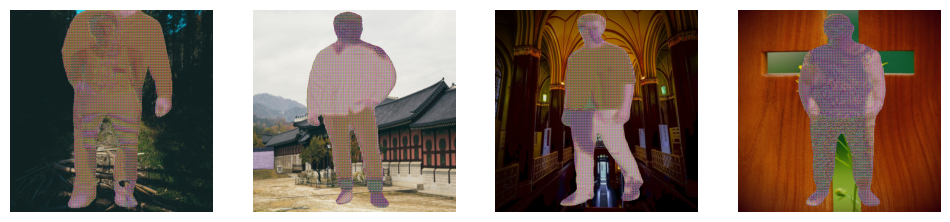

Epoch [2/100], Step [0/19], D Loss: 0.4714, G Loss: 3.1657
Epoch [2/100], Step [10/19], D Loss: 0.3843, G Loss: 3.7215
Epoch [3/100], Step [0/19], D Loss: 0.2801, G Loss: 3.4908
Epoch [3/100], Step [10/19], D Loss: 0.2636, G Loss: 3.9131
Epoch [4/100], Step [0/19], D Loss: 0.1713, G Loss: 3.9291
Epoch [4/100], Step [10/19], D Loss: 0.1398, G Loss: 4.2569
Epoch [5/100], Step [0/19], D Loss: 0.1010, G Loss: 4.6278
Epoch [5/100], Step [10/19], D Loss: 0.0884, G Loss: 4.6018
Epoch [6/100], Step [0/19], D Loss: 0.1049, G Loss: 4.6335
Epoch [6/100], Step [10/19], D Loss: 0.1000, G Loss: 4.4824


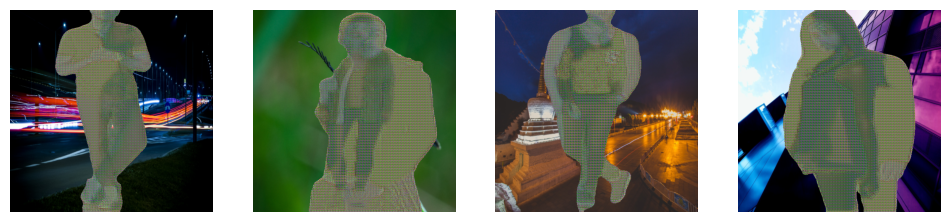

Epoch [7/100], Step [0/19], D Loss: 0.1686, G Loss: 4.1450
Epoch [7/100], Step [10/19], D Loss: 0.0704, G Loss: 4.8698
Epoch [8/100], Step [0/19], D Loss: 0.1003, G Loss: 4.7309
Epoch [8/100], Step [10/19], D Loss: 0.0496, G Loss: 5.4839
Epoch [9/100], Step [0/19], D Loss: 0.1448, G Loss: 5.2583
Epoch [9/100], Step [10/19], D Loss: 0.0570, G Loss: 5.6223
Epoch [10/100], Step [0/19], D Loss: 0.0421, G Loss: 5.5632
Epoch [10/100], Step [10/19], D Loss: 0.0423, G Loss: 5.7771
Epoch [11/100], Step [0/19], D Loss: 0.0378, G Loss: 5.8506
Epoch [11/100], Step [10/19], D Loss: 0.0471, G Loss: 5.6827


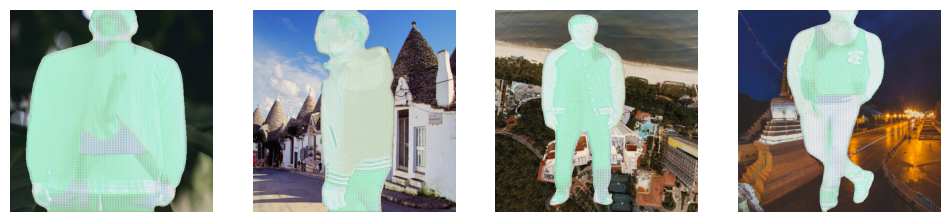

Epoch [12/100], Step [0/19], D Loss: 0.0527, G Loss: 5.6264
Epoch [12/100], Step [10/19], D Loss: 1.0555, G Loss: 5.0547
Epoch [13/100], Step [0/19], D Loss: 0.0634, G Loss: 4.9380
Epoch [13/100], Step [10/19], D Loss: 0.0409, G Loss: 5.5292
Epoch [14/100], Step [0/19], D Loss: 0.0451, G Loss: 4.9719
Epoch [14/100], Step [10/19], D Loss: 0.0601, G Loss: 4.9610
Epoch [15/100], Step [0/19], D Loss: 0.0232, G Loss: 6.1859
Epoch [15/100], Step [10/19], D Loss: 0.0175, G Loss: 5.8529
Epoch [16/100], Step [0/19], D Loss: 0.0248, G Loss: 5.3143
Epoch [16/100], Step [10/19], D Loss: 0.0246, G Loss: 6.2082


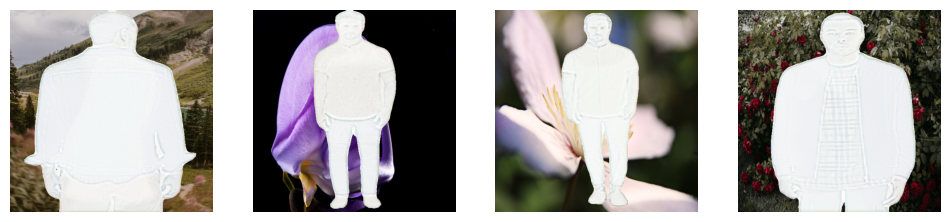

Epoch [17/100], Step [0/19], D Loss: 0.0149, G Loss: 5.9900
Epoch [17/100], Step [10/19], D Loss: 0.0315, G Loss: 5.3290
Epoch [18/100], Step [0/19], D Loss: 0.0105, G Loss: 6.5514
Epoch [18/100], Step [10/19], D Loss: 0.0092, G Loss: 6.8158
Epoch [19/100], Step [0/19], D Loss: 0.0116, G Loss: 6.8387
Epoch [19/100], Step [10/19], D Loss: 0.0132, G Loss: 5.8920
Epoch [20/100], Step [0/19], D Loss: 0.0129, G Loss: 7.0093
Epoch [20/100], Step [10/19], D Loss: 0.0291, G Loss: 5.2968
Epoch [21/100], Step [0/19], D Loss: 0.0066, G Loss: 7.1789
Epoch [21/100], Step [10/19], D Loss: 0.0076, G Loss: 6.6931


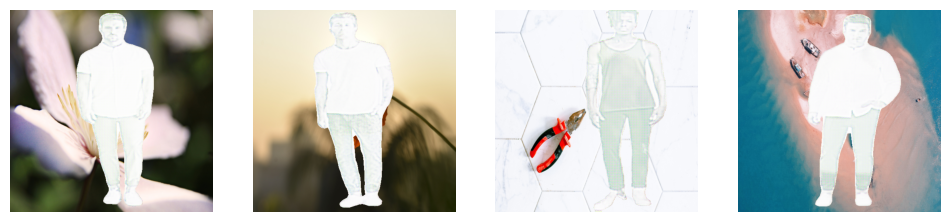

Epoch [22/100], Step [0/19], D Loss: 0.0109, G Loss: 6.4446
Epoch [22/100], Step [10/19], D Loss: 0.0079, G Loss: 6.5559
Epoch [23/100], Step [0/19], D Loss: 0.0075, G Loss: 7.2264
Epoch [23/100], Step [10/19], D Loss: 0.0101, G Loss: 6.4123
Epoch [24/100], Step [0/19], D Loss: 0.0054, G Loss: 7.0335
Epoch [24/100], Step [10/19], D Loss: 0.0092, G Loss: 6.9805
Epoch [25/100], Step [0/19], D Loss: 0.0119, G Loss: 7.3102
Epoch [25/100], Step [10/19], D Loss: 0.0193, G Loss: 5.8508
Epoch [26/100], Step [0/19], D Loss: 0.0060, G Loss: 7.3518
Epoch [26/100], Step [10/19], D Loss: 0.0072, G Loss: 7.0881


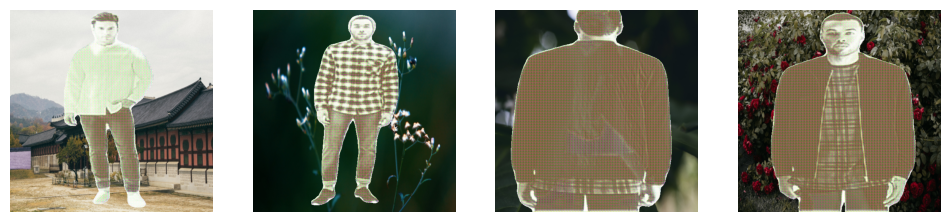

Epoch [27/100], Step [0/19], D Loss: 0.6313, G Loss: 7.7234
Epoch [27/100], Step [10/19], D Loss: 0.0900, G Loss: 4.5178
Epoch [28/100], Step [0/19], D Loss: 0.0422, G Loss: 5.1343
Epoch [28/100], Step [10/19], D Loss: 0.0142, G Loss: 6.3421
Epoch [29/100], Step [0/19], D Loss: 0.0112, G Loss: 6.3492
Epoch [29/100], Step [10/19], D Loss: 0.0183, G Loss: 6.2793
Epoch [30/100], Step [0/19], D Loss: 0.0114, G Loss: 6.3901
Epoch [30/100], Step [10/19], D Loss: 0.0121, G Loss: 6.5705
Epoch [31/100], Step [0/19], D Loss: 0.0105, G Loss: 6.1515
Epoch [31/100], Step [10/19], D Loss: 0.0144, G Loss: 6.8337


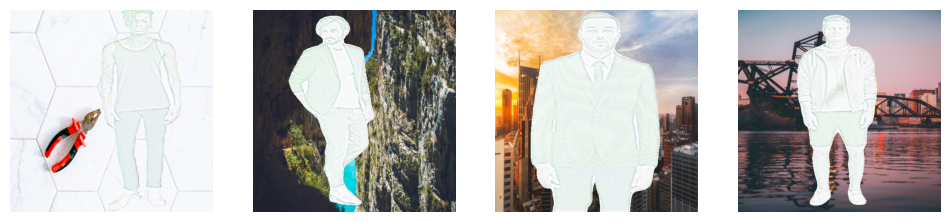

Epoch [32/100], Step [0/19], D Loss: 0.0056, G Loss: 7.2583
Epoch [32/100], Step [10/19], D Loss: 0.0380, G Loss: 4.8160
Epoch [33/100], Step [0/19], D Loss: 0.0052, G Loss: 7.0921
Epoch [33/100], Step [10/19], D Loss: 0.0065, G Loss: 7.6056
Epoch [34/100], Step [0/19], D Loss: 0.0048, G Loss: 7.4807
Epoch [34/100], Step [10/19], D Loss: 0.0072, G Loss: 6.6330
Epoch [35/100], Step [0/19], D Loss: 0.0068, G Loss: 6.4167
Epoch [35/100], Step [10/19], D Loss: 0.0047, G Loss: 6.8691
Epoch [36/100], Step [0/19], D Loss: 0.0081, G Loss: 7.2520
Epoch [36/100], Step [10/19], D Loss: 0.0031, G Loss: 7.6378


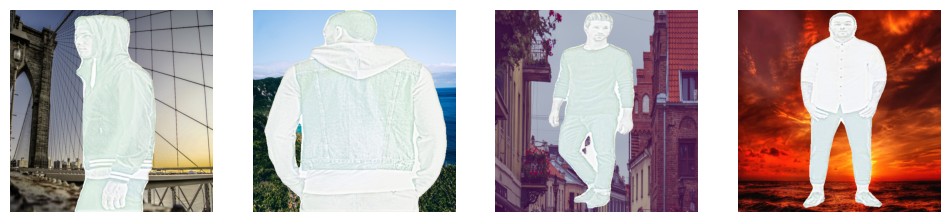

Epoch [37/100], Step [0/19], D Loss: 0.0113, G Loss: 5.7358
Epoch [37/100], Step [10/19], D Loss: 0.0035, G Loss: 7.0950
Epoch [38/100], Step [0/19], D Loss: 0.0037, G Loss: 7.3039
Epoch [38/100], Step [10/19], D Loss: 0.0028, G Loss: 7.4739
Epoch [39/100], Step [0/19], D Loss: 0.0048, G Loss: 7.1133
Epoch [39/100], Step [10/19], D Loss: 0.0027, G Loss: 7.8071
Epoch [40/100], Step [0/19], D Loss: 0.0027, G Loss: 7.6288
Epoch [40/100], Step [10/19], D Loss: 0.0036, G Loss: 7.9930
Epoch [41/100], Step [0/19], D Loss: 0.0027, G Loss: 7.3132
Epoch [41/100], Step [10/19], D Loss: 0.0024, G Loss: 7.9649


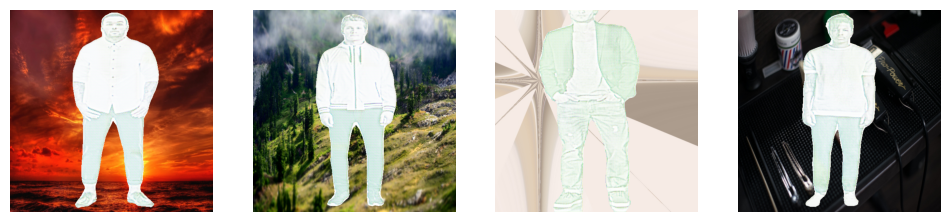

Epoch [42/100], Step [0/19], D Loss: 0.0026, G Loss: 7.8020
Epoch [42/100], Step [10/19], D Loss: 0.0040, G Loss: 7.7008
Epoch [43/100], Step [0/19], D Loss: 0.0050, G Loss: 7.2653
Epoch [43/100], Step [10/19], D Loss: 0.0045, G Loss: 7.2660
Epoch [44/100], Step [0/19], D Loss: 0.0042, G Loss: 7.2302
Epoch [44/100], Step [10/19], D Loss: 0.0039, G Loss: 7.4883
Epoch [45/100], Step [0/19], D Loss: 0.0049, G Loss: 7.4976
Epoch [45/100], Step [10/19], D Loss: 0.0023, G Loss: 7.8884
Epoch [46/100], Step [0/19], D Loss: 0.0061, G Loss: 7.9426
Epoch [46/100], Step [10/19], D Loss: 0.0049, G Loss: 7.5538


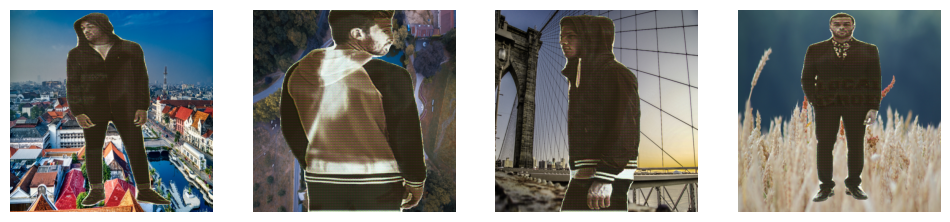

Epoch [47/100], Step [0/19], D Loss: 0.0081, G Loss: 7.4540
Epoch [47/100], Step [10/19], D Loss: 0.0074, G Loss: 8.1214
Epoch [48/100], Step [0/19], D Loss: 0.0039, G Loss: 7.7610
Epoch [48/100], Step [10/19], D Loss: 0.0042, G Loss: 7.2596
Epoch [49/100], Step [0/19], D Loss: 0.0040, G Loss: 7.2929
Epoch [49/100], Step [10/19], D Loss: 0.0032, G Loss: 7.6921
Epoch [50/100], Step [0/19], D Loss: 0.0039, G Loss: 7.1249
Epoch [50/100], Step [10/19], D Loss: 0.0034, G Loss: 7.3052
Epoch [51/100], Step [0/19], D Loss: 0.0026, G Loss: 7.7338
Epoch [51/100], Step [10/19], D Loss: 0.0031, G Loss: 7.9815


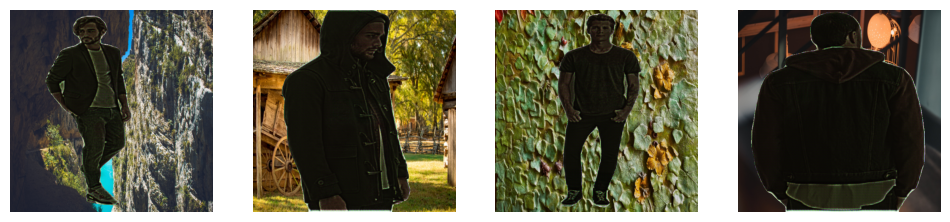

Epoch [52/100], Step [0/19], D Loss: 0.0028, G Loss: 7.6510
Epoch [52/100], Step [10/19], D Loss: 0.0057, G Loss: 6.5870
Epoch [53/100], Step [0/19], D Loss: 0.0023, G Loss: 7.9772
Epoch [53/100], Step [10/19], D Loss: 0.0045, G Loss: 7.5541
Epoch [54/100], Step [0/19], D Loss: 0.0018, G Loss: 8.0849
Epoch [54/100], Step [10/19], D Loss: 0.0037, G Loss: 6.8559
Epoch [55/100], Step [0/19], D Loss: 0.0025, G Loss: 8.2505
Epoch [55/100], Step [10/19], D Loss: 0.0023, G Loss: 7.8930
Epoch [56/100], Step [0/19], D Loss: 0.0027, G Loss: 7.5817
Epoch [56/100], Step [10/19], D Loss: 0.0018, G Loss: 8.3427


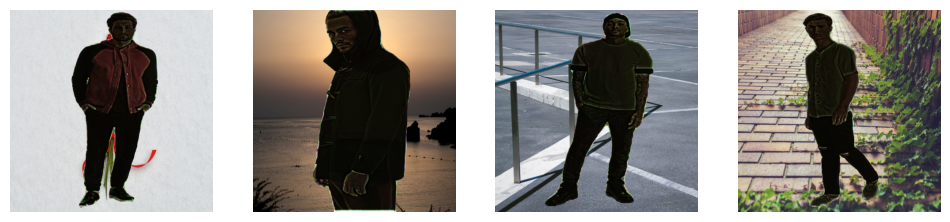

Epoch [57/100], Step [0/19], D Loss: 0.0025, G Loss: 7.6104
Epoch [57/100], Step [10/19], D Loss: 0.0013, G Loss: 8.1972
Epoch [58/100], Step [0/19], D Loss: 0.0020, G Loss: 7.9582
Epoch [58/100], Step [10/19], D Loss: 0.0022, G Loss: 8.1056
Epoch [59/100], Step [0/19], D Loss: 0.0018, G Loss: 8.4965
Epoch [59/100], Step [10/19], D Loss: 0.0027, G Loss: 7.9778
Epoch [60/100], Step [0/19], D Loss: 0.0014, G Loss: 8.3380
Epoch [60/100], Step [10/19], D Loss: 0.0020, G Loss: 7.4641
Epoch [61/100], Step [0/19], D Loss: 0.0012, G Loss: 8.7379
Epoch [61/100], Step [10/19], D Loss: 0.0015, G Loss: 7.9244


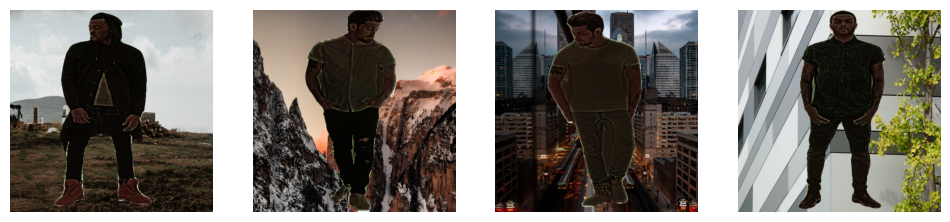

Epoch [62/100], Step [0/19], D Loss: 0.0020, G Loss: 8.2780
Epoch [62/100], Step [10/19], D Loss: 0.0017, G Loss: 8.1719
Epoch [63/100], Step [0/19], D Loss: 0.0014, G Loss: 8.3867
Epoch [63/100], Step [10/19], D Loss: 0.0017, G Loss: 8.2867
Epoch [64/100], Step [0/19], D Loss: 0.0015, G Loss: 8.0635
Epoch [64/100], Step [10/19], D Loss: 0.0022, G Loss: 7.7952
Epoch [65/100], Step [0/19], D Loss: 0.0011, G Loss: 8.1477
Epoch [65/100], Step [10/19], D Loss: 0.0011, G Loss: 8.9319
Epoch [66/100], Step [0/19], D Loss: 0.0009, G Loss: 8.6928
Epoch [66/100], Step [10/19], D Loss: 0.0014, G Loss: 8.0977


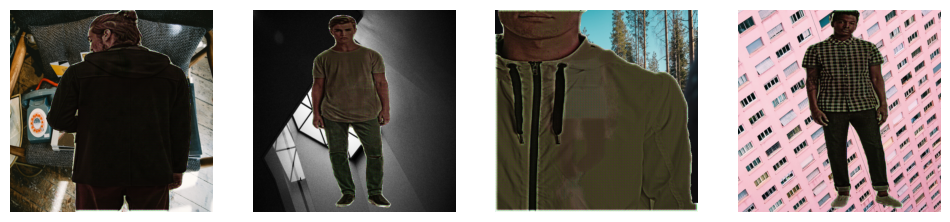

Epoch [67/100], Step [0/19], D Loss: 0.0013, G Loss: 8.6231
Epoch [67/100], Step [10/19], D Loss: 0.0013, G Loss: 8.9663
Epoch [68/100], Step [0/19], D Loss: 0.0011, G Loss: 8.8731
Epoch [68/100], Step [10/19], D Loss: 0.0010, G Loss: 8.5031
Epoch [69/100], Step [0/19], D Loss: 0.0009, G Loss: 8.9659
Epoch [69/100], Step [10/19], D Loss: 0.0010, G Loss: 8.7108
Epoch [70/100], Step [0/19], D Loss: 0.0008, G Loss: 8.4083
Epoch [70/100], Step [10/19], D Loss: 0.0009, G Loss: 8.7083
Epoch [71/100], Step [0/19], D Loss: 0.0011, G Loss: 8.2021
Epoch [71/100], Step [10/19], D Loss: 0.0020, G Loss: 8.4174


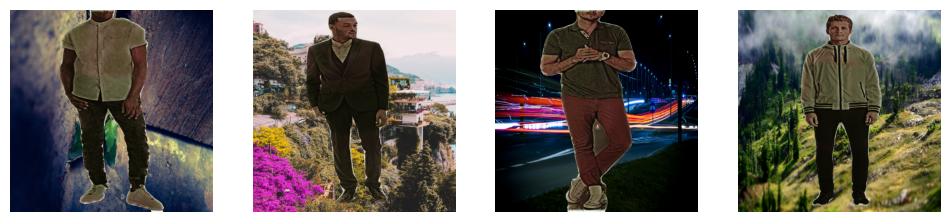

Epoch [72/100], Step [0/19], D Loss: 0.0009, G Loss: 8.5197
Epoch [72/100], Step [10/19], D Loss: 0.0010, G Loss: 8.9031
Epoch [73/100], Step [0/19], D Loss: 0.0010, G Loss: 8.3211
Epoch [73/100], Step [10/19], D Loss: 0.0009, G Loss: 8.0673
Epoch [74/100], Step [0/19], D Loss: 0.0012, G Loss: 7.8891
Epoch [74/100], Step [10/19], D Loss: 0.0011, G Loss: 9.1522
Epoch [75/100], Step [0/19], D Loss: 0.0010, G Loss: 8.0758
Epoch [75/100], Step [10/19], D Loss: 0.0010, G Loss: 8.5993
Epoch [76/100], Step [0/19], D Loss: 0.0008, G Loss: 9.0258
Epoch [76/100], Step [10/19], D Loss: 0.0010, G Loss: 9.0912


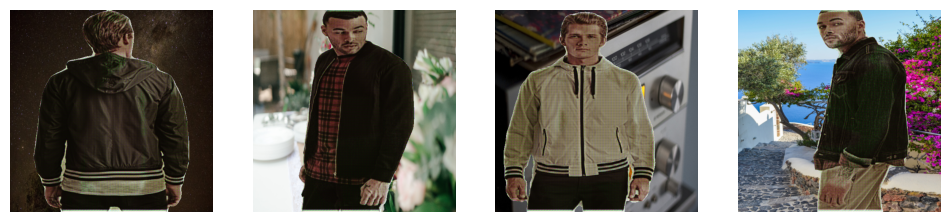

Epoch [77/100], Step [0/19], D Loss: 0.0011, G Loss: 8.3214
Epoch [77/100], Step [10/19], D Loss: 0.0006, G Loss: 9.1101
Epoch [78/100], Step [0/19], D Loss: 0.0010, G Loss: 8.7908
Epoch [78/100], Step [10/19], D Loss: 0.0007, G Loss: 8.9077
Epoch [79/100], Step [0/19], D Loss: 0.0011, G Loss: 8.1135
Epoch [79/100], Step [10/19], D Loss: 0.0009, G Loss: 8.4972
Epoch [80/100], Step [0/19], D Loss: 0.0014, G Loss: 7.8864
Epoch [80/100], Step [10/19], D Loss: 0.0033, G Loss: 7.1440
Epoch [81/100], Step [0/19], D Loss: 0.0008, G Loss: 8.4571
Epoch [81/100], Step [10/19], D Loss: 0.0006, G Loss: 9.0060


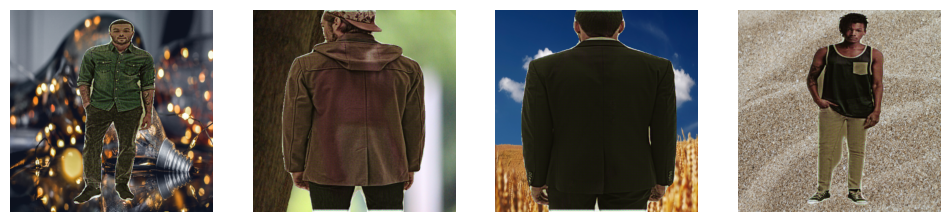

Epoch [82/100], Step [0/19], D Loss: 0.0008, G Loss: 8.8625
Epoch [82/100], Step [10/19], D Loss: 0.0008, G Loss: 8.5624
Epoch [83/100], Step [0/19], D Loss: 0.0007, G Loss: 9.1019
Epoch [83/100], Step [10/19], D Loss: 0.0010, G Loss: 8.4636
Epoch [84/100], Step [0/19], D Loss: 0.0021, G Loss: 7.6364
Epoch [84/100], Step [10/19], D Loss: 0.0023, G Loss: 7.0043
Epoch [85/100], Step [0/19], D Loss: 0.0006, G Loss: 9.2655
Epoch [85/100], Step [10/19], D Loss: 0.0021, G Loss: 8.5249
Epoch [86/100], Step [0/19], D Loss: 0.0007, G Loss: 8.9494
Epoch [86/100], Step [10/19], D Loss: 0.0007, G Loss: 9.0162


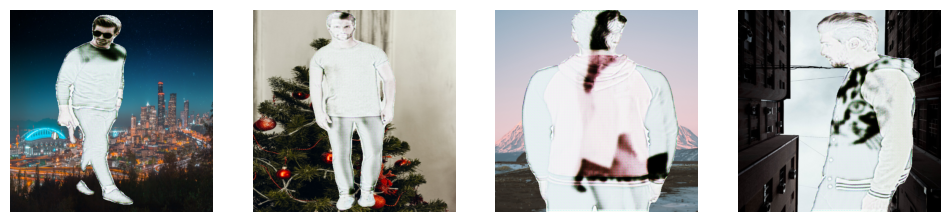

Epoch [87/100], Step [0/19], D Loss: 0.0015, G Loss: 8.9718
Epoch [87/100], Step [10/19], D Loss: 0.0010, G Loss: 8.8889
Epoch [88/100], Step [0/19], D Loss: 0.0009, G Loss: 8.9953
Epoch [88/100], Step [10/19], D Loss: 0.0010, G Loss: 9.1028
Epoch [89/100], Step [0/19], D Loss: 0.0008, G Loss: 9.6233
Epoch [89/100], Step [10/19], D Loss: 0.0007, G Loss: 9.8669
Epoch [90/100], Step [0/19], D Loss: 0.0008, G Loss: 9.4832
Epoch [90/100], Step [10/19], D Loss: 0.0011, G Loss: 9.1977
Epoch [91/100], Step [0/19], D Loss: 0.7551, G Loss: 3.7518
Epoch [91/100], Step [10/19], D Loss: 0.0882, G Loss: 3.7476


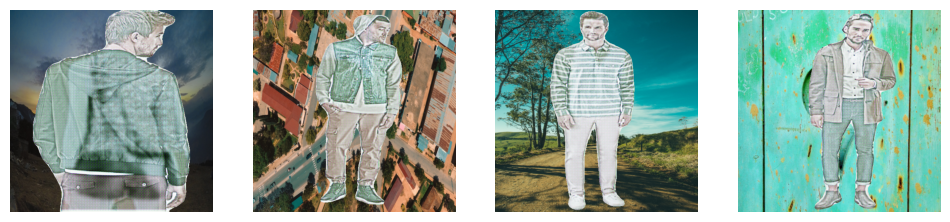

Epoch [92/100], Step [0/19], D Loss: 0.1365, G Loss: 3.6252
Epoch [92/100], Step [10/19], D Loss: 0.0282, G Loss: 5.5041
Epoch [93/100], Step [0/19], D Loss: 0.0164, G Loss: 5.6401
Epoch [93/100], Step [10/19], D Loss: 0.0231, G Loss: 5.2522
Epoch [94/100], Step [0/19], D Loss: 0.0108, G Loss: 6.2828
Epoch [94/100], Step [10/19], D Loss: 0.0134, G Loss: 5.9478
Epoch [95/100], Step [0/19], D Loss: 0.0100, G Loss: 6.6188
Epoch [95/100], Step [10/19], D Loss: 0.0070, G Loss: 7.0203
Epoch [96/100], Step [0/19], D Loss: 0.0061, G Loss: 7.2803
Epoch [96/100], Step [10/19], D Loss: 0.0152, G Loss: 5.8492


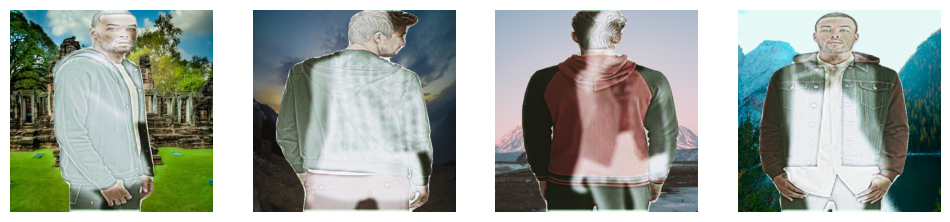

Epoch [97/100], Step [0/19], D Loss: 0.0069, G Loss: 7.8060
Epoch [97/100], Step [10/19], D Loss: 0.0068, G Loss: 6.7545
Epoch [98/100], Step [0/19], D Loss: 0.0139, G Loss: 5.8789
Epoch [98/100], Step [10/19], D Loss: 0.0043, G Loss: 6.9791
Epoch [99/100], Step [0/19], D Loss: 0.0024, G Loss: 7.8754
Epoch [99/100], Step [10/19], D Loss: 0.0044, G Loss: 7.3261
Epoch [100/100], Step [0/19], D Loss: 0.0029, G Loss: 7.2490
Epoch [100/100], Step [10/19], D Loss: 0.0162, G Loss: 6.0662
Enhanced generator model saved as enhanced_generator.pth


In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import transforms
from torchvision.models.segmentation import deeplabv3_resnet50
from torchvision.models import vgg19
from torchvision.transforms.functional import affine
from PIL import Image
import matplotlib.pyplot as plt


# Dataset for clothing, model, and background images
class FashionDataset(Dataset):
    def __init__(self, clothing_dir, model_dir, background_dir, transform=None):
        self.clothing_images = sorted(os.listdir(clothing_dir))
        self.model_images = sorted(os.listdir(model_dir))
        self.background_images = sorted(os.listdir(background_dir))
        self.clothing_dir = clothing_dir
        self.model_dir = model_dir
        self.background_dir = background_dir
        self.transform = transform

    def __len__(self):
        return len(self.clothing_images)

    def __getitem__(self, idx):
        clothing = Image.open(os.path.join(self.clothing_dir, self.clothing_images[idx])).convert("RGB")
        model = Image.open(os.path.join(self.model_dir, self.model_images[idx % len(self.model_images)])).convert("RGB")
        background = Image.open(os.path.join(self.background_dir, self.background_images[idx % len(self.background_images)])).convert("RGB")

        if self.transform:
            clothing = self.transform(clothing)
            model = self.transform(model)
            background = self.transform(background)

        return clothing, model, background


# Generator: Enhanced U-Net-based architecture
class EnhancedGenerator(nn.Module):
    def __init__(self):
        super(EnhancedGenerator, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(9, 64, kernel_size=4, stride=2, padding=1),  # Increased input channels for additional features
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1),
            nn.Tanh(),
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x


# Discriminator using PatchGAN
class PatchDiscriminator(nn.Module):
    def __init__(self):
        super(PatchDiscriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(9, 64, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 1, kernel_size=4, stride=1, padding=0),
            nn.Sigmoid(),
        )

    def forward(self, x):
        return self.model(x)


# Load pretrained DeepLabV3 for segmentation mask generation
segmentation_model = deeplabv3_resnet50(pretrained=True).eval()


def generate_torso_mask(image):
    """
    Extract the torso region using a pre-trained segmentation model.
    """
    with torch.no_grad():
        output = segmentation_model(image)['out']
        torso_mask = ((output.argmax(dim=1, keepdim=True) == 15).float())  # Torso class
    return torso_mask


# Garment warping using spatial transformers
def warp_clothing(clothing, mask):
    """
    Warp the clothing to fit the torso mask dynamically.
    """
    return clothing * mask


# Perceptual Loss using VGG
vgg = vgg19(pretrained=True).features[:16].eval()
for param in vgg.parameters():
    param.requires_grad = False


def perceptual_loss(fake, real):
    fake_features = vgg(fake)
    real_features = vgg(real)
    return nn.MSELoss()(fake_features, real_features)


# Blending function
def blend_with_background(foreground, background, mask):
    """
    Blend the generated foreground with the background using a binary mask.
    """
    return mask * foreground + (1 - mask) * background


# Training loop
def train_gan(generator, discriminator, dataloader, epochs, device):
    generator = generator.to(device)
    discriminator = discriminator.to(device)
    segmentation_model.to(device)
    vgg.to(device)

    opt_gen = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
    opt_disc = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))
    bce_loss = nn.BCELoss()

    for epoch in range(epochs):
        for i, (clothing, model, background) in enumerate(dataloader):
            clothing, model, background = clothing.to(device), model.to(device), background.to(device)

            # Step 1: Generate torso mask
            torso_mask = generate_torso_mask(model)

            # Step 2: Warp clothing
            warped_clothing = warp_clothing(clothing, torso_mask)

            # Step 3: Generate foreground with pose/body conditioning
            # Duplicate the torso mask to match 3 channels
            torso_mask_3ch = torch.cat([torso_mask, torso_mask, torso_mask], dim=1)

            # Concatenate warped clothing, model, and torso mask as the generator input
            input_tensor = torch.cat([warped_clothing, model, torso_mask_3ch], dim=1)
            fake_foreground = generator(input_tensor)

            # Step 4: Generate mask for blending
            blending_mask = generate_torso_mask(model)

            # Step 5: Blend foreground with background
            blended_output = blend_with_background(fake_foreground, background, blending_mask)

            # Prepare inputs for discriminator
            real_input = torch.cat([clothing, model, background], dim=1)
            fake_input = torch.cat([warped_clothing, blended_output, background], dim=1)

            # Train Discriminator
            real_preds = discriminator(real_input)
            fake_preds = discriminator(fake_input.detach())
            real_loss = bce_loss(real_preds, torch.ones_like(real_preds))
            fake_loss = bce_loss(fake_preds, torch.zeros_like(fake_preds))
            d_loss = (real_loss + fake_loss) / 2

            opt_disc.zero_grad()
            d_loss.backward()
            opt_disc.step()

            # Train Generator
            fake_preds = discriminator(fake_input)
            g_loss_adv = bce_loss(fake_preds, torch.ones_like(fake_preds))
            g_loss_percep = perceptual_loss(fake_foreground, model)
            g_loss = g_loss_adv + 0.5 * g_loss_percep

            opt_gen.zero_grad()
            g_loss.backward()
            opt_gen.step()

            # Logging
            if i % 10 == 0:
                print(f"Epoch [{epoch+1}/{epochs}], Step [{i}/{len(dataloader)}], D Loss: {d_loss.item():.4f}, G Loss: {g_loss.item():.4f}")

        # Display sample outputs every 5 epochs
        if epoch % 5 == 0:
            with torch.no_grad():
                sample = blended_output[:4].cpu()  # Select 4 examples
                sample = (sample * 0.5 + 0.5).permute(0, 2, 3, 1).numpy()  # Unnormalize and transpose

                # Plot samples
                fig, axes = plt.subplots(1, 4, figsize=(12, 4))
                for ax, img in zip(axes, sample):
                    ax.imshow(img)
                    ax.axis("off")
                plt.show()

    # Save the trained generator
    torch.save(generator.state_dict(), "enhanced_generator11.pth")
    print("Enhanced generator model saved as enhanced_generator.pth")


# Main function
def main():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    transform = transforms.Compose([
        transforms.Resize((512, 512)),  # High resolution
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
    ])

    dataset = FashionDataset(
        clothing_dir="/content/drive/MyDrive/MLProject/clothingg/",
        model_dir="/content/drive/MyDrive/MLProject/models/",
        background_dir="/content/drive/MyDrive/MLProject/bg/",
        transform=transform,
    )
    dataloader = DataLoader(dataset, batch_size=8, shuffle=True)

    generator = EnhancedGenerator()
    discriminator = PatchDiscriminator()

    train_gan(generator, discriminator, dataloader, epochs=100, device=device)


if __name__ == "__main__":
    main()


# **Testing**

<ipython-input-27-9dbb3a5ed26f>:119: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  generator.load_state_dict(torch.load("enhanced_generator11.pth", map_location=device))


Trained generator loaded successfully!


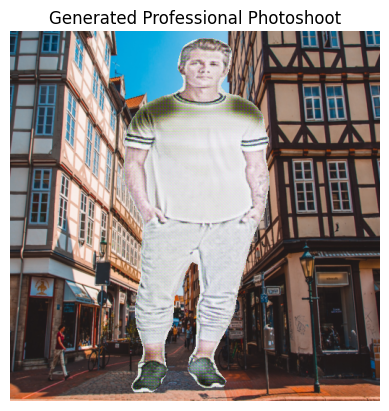

In [ ]:
import torch
from torchvision.transforms import transforms
from torchvision.transforms.functional import affine
from torchvision.models.segmentation import deeplabv3_resnet50
from PIL import Image
import matplotlib.pyplot as plt
import torch.nn as nn


# Enhanced Generator: U-Net-based architecture
class EnhancedGenerator(nn.Module):
    def __init__(self):
        super(EnhancedGenerator, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(9, 64, kernel_size=4, stride=2, padding=1),  # Matches 9-channel input
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1),
            nn.Tanh(),
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x


# Load the pretrained DeepLabV3 for mask generation
segmentation_model = deeplabv3_resnet50(pretrained=True).eval()


def generate_torso_mask(image):
    """
    Extract the torso region using a pre-trained segmentation model.
    """
    with torch.no_grad():
        output = segmentation_model(image)['out']
        torso_mask = ((output.argmax(dim=1, keepdim=True) == 15).float())  # Torso class
    return torso_mask


# Garment warping using spatial transformers
def warp_clothing(clothing, mask):
    """
    Warp the clothing to fit the torso mask dynamically.
    """
    return clothing * mask


# Blending function
def blend_with_background(foreground, background, mask):
    """
    Blend the generated foreground with the background using a binary mask.
    """
    return mask * foreground + (1 - mask) * background


# Test function
def test_generator(generator, clothing_path, model_path, background_path, device):
    # Transformations for input images
    transform = transforms.Compose([
        transforms.Resize((512, 512)),  # Match the training resolution
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
    ])

    # Load and preprocess test images
    clothing = transform(Image.open(clothing_path).convert("RGB")).unsqueeze(0).to(device)
    model = transform(Image.open(model_path).convert("RGB")).unsqueeze(0).to(device)
    background = transform(Image.open(background_path).convert("RGB")).unsqueeze(0).to(device)

    generator = generator.to(device)
    segmentation_model.to(device)

    generator.eval()

    with torch.no_grad():
        # Step 1: Generate torso mask
        torso_mask = generate_torso_mask(model)

        # Step 2: Warp clothing
        warped_clothing = warp_clothing(clothing, torso_mask)

        # Step 3: Prepare input for generator
        torso_mask_3ch = torch.cat([torso_mask, torso_mask, torso_mask], dim=1)  # Duplicate to 3 channels
        input_tensor = torch.cat([warped_clothing, model, torso_mask_3ch], dim=1)  # 9-channel input

        # Step 4: Generate foreground
        generated_foreground = generator(input_tensor)

        # Step 5: Blend foreground with background
        blending_mask = generate_torso_mask(model)
        blended_output = blend_with_background(generated_foreground, background, blending_mask)

    # Convert output to a format suitable for visualization
    blended_output = blended_output.squeeze(0).cpu()  # Remove batch dimension
    blended_output = (blended_output * 0.5 + 0.5).permute(1, 2, 0).numpy()  # Unnormalize and convert to HWC

    # Display the final output using Matplotlib
    plt.imshow(blended_output)
    plt.axis("off")
    plt.title("Generated Professional Photoshoot")
    plt.show()


# Main function for testing
def main():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Load the trained generator
    generator = EnhancedGenerator()
    generator.load_state_dict(torch.load("enhanced_generator11.pth", map_location=device))
    print("Trained generator loaded successfully!")

    clothing_path = "/content/drive/MyDrive/MLProject/models/MEN-Sweatshirts_Hoodies-id_00007804-14_3_back.jpg"
    model_path = "/content/drive/MyDrive/MLProject/models/MEN-Pants-id_00006688-02_7_additional.jpg"
    background_path = "/content/drive/MyDrive/MLProject/bg/h_bae5cd2c.jpg"

    # Test the generator with the provided paths
    test_generator(generator, clothing_path, model_path, background_path, device)


if __name__ == "__main__":
    main()


# **code Training:**

In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import transforms
from torchvision.models.segmentation import deeplabv3_resnet50
from torchvision.models.detection import keypointrcnn_resnet50_fpn
from torchvision.models import vgg19
from torchvision.transforms.functional import affine
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np


# Dataset for clothing, model, and background images
class FashionDataset(Dataset):
    def __init__(self, clothing_dir, model_dir, background_dir, transform=None):
        self.clothing_images = sorted(os.listdir(clothing_dir))
        self.model_images = sorted(os.listdir(model_dir))
        self.background_images = sorted(os.listdir(background_dir))
        self.clothing_dir = clothing_dir
        self.model_dir = model_dir
        self.background_dir = background_dir
        self.transform = transform

    def __len__(self):
        return len(self.clothing_images)

    def __getitem__(self, idx):
        clothing = Image.open(os.path.join(self.clothing_dir, self.clothing_images[idx])).convert("RGB")
        model = Image.open(os.path.join(self.model_dir, self.model_images[idx % len(self.model_images)])).convert("RGB")
        background = Image.open(os.path.join(self.background_dir, self.background_images[idx % len(self.background_images)])).convert("RGB")

        if self.transform:
            clothing = self.transform(clothing)
            model = self.transform(model)
            background = self.transform(background)

        return clothing, model, background


# Generator: Enhanced U-Net-based architecture
class EnhancedGenerator(nn.Module):
    def __init__(self):
        super(EnhancedGenerator, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(26, 64, kernel_size=4, stride=2, padding=1),  # Updated input channels to 26
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1),
            nn.Tanh(),
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x


class PatchDiscriminator(nn.Module):
    def __init__(self):
        super(PatchDiscriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(26, 64, kernel_size=4, stride=2, padding=1),  # Updated input channels to 26
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 1, kernel_size=4, stride=1, padding=0),
            nn.Sigmoid(),
        )

    def forward(self, x):
        return self.model(x)



# Load pretrained DeepLabV3 for segmentation mask generation
segmentation_model = deeplabv3_resnet50(pretrained=True).eval()

# Load pretrained Keypoint R-CNN for pose estimation
pose_model = keypointrcnn_resnet50_fpn(pretrained=True).eval()


def generate_torso_mask(image):
    """
    Extract the torso region using a pre-trained segmentation model.
    """
    with torch.no_grad():
        output = segmentation_model(image)['out']
        torso_mask = ((output.argmax(dim=1, keepdim=True) == 15).float())  # Torso class
        print("Generated torso mask.")
    return torso_mask


def generate_pose_heatmaps(images, device):
    """
    Generate pose keypoints heatmaps using a pose estimation model.
    Args:
        images: A batch of images (shape: [B, C, H, W]).
        device: The device (CPU or CUDA) to run the pose estimation model.
    Returns:
        A tensor of heatmaps for all images in the batch (shape: [B, 17, H, W]).
    """
    batch_size, _, height, width = images.shape
    heatmaps_batch = []

    # Process each image independently
    for i in range(batch_size):
        image = images[i].unsqueeze(0)  # Extract the i-th image and add a batch dimension
        image_list = [image.squeeze(0).to(device)]  # Convert to list of 3D tensors
        with torch.no_grad():
            detections = pose_model(image_list)

            # Check if keypoints are detected
            if len(detections[0]['keypoints']) == 0:
                print(f"No keypoints detected for image {i}. Creating empty heatmaps.")
                heatmaps = np.zeros((17, height, width))  # Empty heatmaps
            else:
                keypoints = detections[0]['keypoints'][:, 0, :2].cpu().numpy()  # Extract the first set of (x, y)
                heatmaps = np.zeros((17, height, width))  # 17 keypoints
                for j, (x, y) in enumerate(keypoints):
                    if 0 <= int(y) < height and 0 <= int(x) < width:
                        heatmaps[j, int(y), int(x)] = 1

        # Append the heatmaps for this image
        heatmaps_batch.append(torch.tensor(heatmaps).unsqueeze(0))

    # Stack all heatmaps into a single tensor
    heatmaps_batch = torch.cat(heatmaps_batch, dim=0).to(device)  # Shape: [B, 17, H, W]
    print("Generated pose heatmaps.")
    return heatmaps_batch




# Garment warping using spatial transformers
def warp_clothing(clothing, mask):
    """
    Warp the clothing to fit the torso mask dynamically.
    """
    print("Warped clothing to fit the torso mask.")
    return clothing * mask


# Perceptual Loss using VGG
vgg = vgg19(pretrained=True).features[:16].eval()
for param in vgg.parameters():
    param.requires_grad = False


def perceptual_loss(fake, real):
    fake_features = vgg(fake)
    real_features = vgg(real)
    loss = nn.MSELoss()(fake_features, real_features)
    print("Calculated perceptual loss.")
    return loss


# Blending function
def blend_with_background(foreground, background, mask):
    """
    Blend the generated foreground with the background using a binary mask.
    """
    print("Blended foreground with background.")
    return mask * foreground + (1 - mask) * background


# Training loop
def train_gan(generator, discriminator, dataloader, epochs, device):
    generator = generator.to(device)
    discriminator = discriminator.to(device)
    segmentation_model.to(device)
    pose_model.to(device)
    vgg.to(device)

    opt_gen = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
    opt_disc = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))
    bce_loss = nn.BCELoss()

    print("Training started...")

    for epoch in range(epochs):
        print(f"\nEpoch [{epoch+1}/{epochs}]")
        for i, (clothing, model, background) in enumerate(dataloader):
            # Step 1: Load Data
            clothing = clothing.to(device).float()
            model = model.to(device).float()
            background = background.to(device).float()

            print(f"Step [{i+1}/{len(dataloader)}]:")
            print(f"  Clothing dtype: {clothing.dtype}, Model dtype: {model.dtype}, Background dtype: {background.dtype}")

            # Step 2: Generate torso mask and pose heatmaps
            torso_mask = generate_torso_mask(model).float()
            pose_heatmaps = generate_pose_heatmaps(model, device).float()

            print(f"  Torso mask dtype: {torso_mask.dtype}, Pose heatmaps dtype: {pose_heatmaps.dtype}")

            # Step 3: Warp clothing
            warped_clothing = warp_clothing(clothing, torso_mask).float()

            print(f"  Warped clothing dtype: {warped_clothing.dtype}")

            # Step 4: Prepare input tensor
            torso_mask_3ch = torch.cat([torso_mask, torso_mask, torso_mask], dim=1).float()
            input_tensor = torch.cat([warped_clothing, model, torso_mask_3ch, pose_heatmaps], dim=1).float()

            print(f"  Input tensor dtype: {input_tensor.dtype}, Shape: {input_tensor.shape}")

            # Check generator weight dtype
            print(f"  Generator weight dtype: {next(generator.parameters()).dtype}")

            # Step 5: Generate foreground
            fake_foreground = generator(input_tensor)
            print("  Generated foreground.")

            # Step 6: Blend with background
            blended_output = blend_with_background(fake_foreground, background, torso_mask)
            print("  Blended foreground with background.")


            real_input = torch.cat([clothing, model, background, pose_heatmaps], dim=1).float()
            fake_input = torch.cat([warped_clothing, blended_output, background, pose_heatmaps], dim=1).float()

            print(f"Discriminator real input shape: {real_input.shape}")
            print(f"Discriminator fake input shape: {fake_input.shape}")

            real_preds = discriminator(real_input)
            fake_preds = discriminator(fake_input.detach())

            real_loss = bce_loss(real_preds, torch.ones_like(real_preds))
            fake_loss = bce_loss(fake_preds, torch.zeros_like(fake_preds))
            d_loss = (real_loss + fake_loss) / 2
            print(f"D Loss: {d_loss.item():.4f}")

            opt_disc.zero_grad()
            d_loss.backward()
            opt_disc.step()

            # Train Generator
            fake_preds = discriminator(fake_input)
            g_loss_adv = bce_loss(fake_preds, torch.ones_like(fake_preds))
            g_loss_percep = perceptual_loss(fake_foreground, model)
            g_loss = g_loss_adv + 0.5 * g_loss_percep
            print(f"G Loss: {g_loss.item():.4f}")

            opt_gen.zero_grad()
            g_loss.backward()
            opt_gen.step()

        # Display sample outputs every 5 epochs
        if True:
            with torch.no_grad():
                sample = blended_output[:4].cpu()  # Select 4 examples
                sample = (sample * 0.5 + 0.5).permute(0, 2, 3, 1).numpy()  # Unnormalize and transpose

                # Plot samples
                fig, axes = plt.subplots(1, 4, figsize=(12, 4))
                for ax, img in zip(axes, sample):
                    ax.imshow(img)
                    ax.axis("off")
                plt.show()

    # Save the trained generator
    torch.save(generator.state_dict(), "enhanced_generator_with_pose.pth")
    print("Training complete. Model saved as enhanced_generator_with_pose.pth.")


# Main function
def main():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    transform = transforms.Compose([
        transforms.Resize((512, 512)),  # High resolution
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
    ])

    dataset = FashionDataset(
        clothing_dir="/content/drive/MyDrive/MLProject/dress/",
        model_dir="/content/drive/MyDrive/MLProject/models/",
        background_dir="/content/drive/MyDrive/MLProject/bg/",
        transform=transform,
    )
    dataloader = DataLoader(dataset, batch_size=8, shuffle=True)

    generator = EnhancedGenerator()
    discriminator = PatchDiscriminator()

    train_gan(generator, discriminator, dataloader, epochs=100, device=device)


if __name__ == "__main__":
    main()


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=KeypointRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=KeypointRCNN_Res

Training started...

Epoch [1/100]
Step [1/323]:
  Clothing dtype: torch.float32, Model dtype: torch.float32, Background dtype: torch.float32
Generated torso mask.
Generated pose heatmaps.
  Torso mask dtype: torch.float32, Pose heatmaps dtype: torch.float32
Warped clothing to fit the torso mask.
  Warped clothing dtype: torch.float32
  Input tensor dtype: torch.float32, Shape: torch.Size([8, 26, 512, 512])
  Generator weight dtype: torch.float32
  Generated foreground.
Blended foreground with background.
  Blended foreground with background.
Discriminator real input shape: torch.Size([8, 26, 512, 512])
Discriminator fake input shape: torch.Size([8, 26, 512, 512])
D Loss: 0.6988
Calculated perceptual loss.
G Loss: 6.4380
Step [2/323]:
  Clothing dtype: torch.float32, Model dtype: torch.float32, Background dtype: torch.float32
Generated torso mask.
Generated pose heatmaps.
  Torso mask dtype: torch.float32, Pose heatmaps dtype: torch.float32
Warped clothing to fit the torso mask.
  Warp

IndexError: index 17 is out of bounds for axis 0 with size 17

# **Latest code Training:**

Training started...

Epoch [1/100]
Step [1/323]:
Keypoints detected for image 0: (1, 2)
Keypoints detected for image 1: (1, 2)
Keypoints detected for image 2: (1, 2)
Keypoints detected for image 3: (3, 2)
Keypoints detected for image 4: (1, 2)
Keypoints detected for image 5: (1, 2)
Keypoints detected for image 6: (18, 2)
Keypoints detected for image 7: (1, 2)
Generated pose heatmaps.
D Loss: 0.7040
G Loss: 7.0949


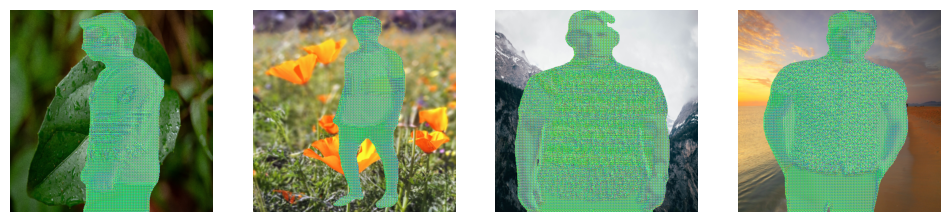

Step [2/323]:
Keypoints detected for image 0: (5, 2)
Keypoints detected for image 1: (1, 2)
Keypoints detected for image 2: (1, 2)
Keypoints detected for image 3: (4, 2)
Keypoints detected for image 4: (2, 2)
Keypoints detected for image 5: (1, 2)
Keypoints detected for image 6: (4, 2)
Keypoints detected for image 7: (1, 2)
Generated pose heatmaps.
D Loss: 0.7043
G Loss: 6.4583


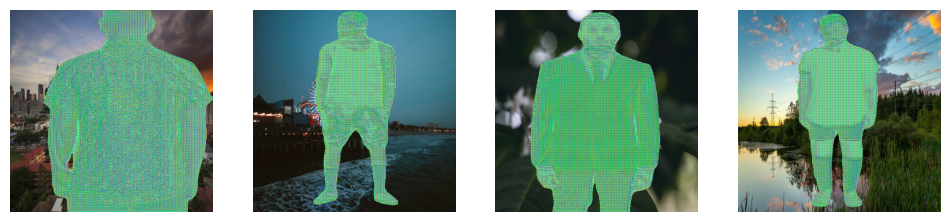

Step [3/323]:
Keypoints detected for image 0: (4, 2)
Keypoints detected for image 1: (4, 2)
Keypoints detected for image 2: (4, 2)
Keypoints detected for image 3: (5, 2)
Keypoints detected for image 4: (2, 2)
Keypoints detected for image 5: (4, 2)
Keypoints detected for image 6: (1, 2)
Keypoints detected for image 7: (1, 2)
Generated pose heatmaps.
D Loss: 0.7023
G Loss: 5.0789


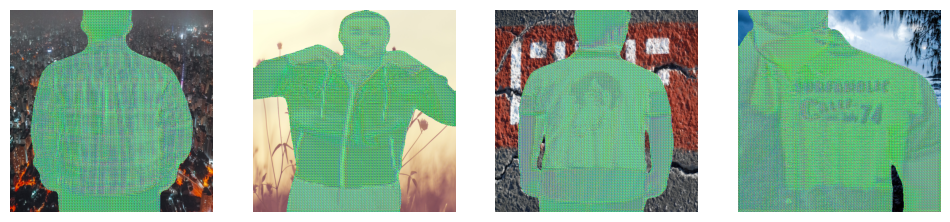

Step [4/323]:
Keypoints detected for image 0: (1, 2)
Keypoints detected for image 1: (2, 2)
Keypoints detected for image 2: (2, 2)
Keypoints detected for image 3: (1, 2)
Keypoints detected for image 4: (2, 2)
Keypoints detected for image 5: (2, 2)
Keypoints detected for image 6: (2, 2)
Keypoints detected for image 7: (1, 2)
Generated pose heatmaps.
D Loss: 0.6504
G Loss: 4.0882


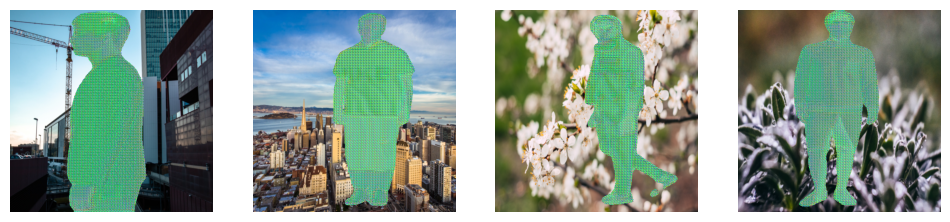

Step [5/323]:
Keypoints detected for image 0: (1, 2)
Keypoints detected for image 1: (1, 2)
Keypoints detected for image 2: (3, 2)
Keypoints detected for image 3: (2, 2)
Keypoints detected for image 4: (1, 2)
Keypoints detected for image 5: (1, 2)
Keypoints detected for image 6: (2, 2)
Keypoints detected for image 7: (1, 2)
Generated pose heatmaps.
D Loss: 0.6433
G Loss: 3.9678


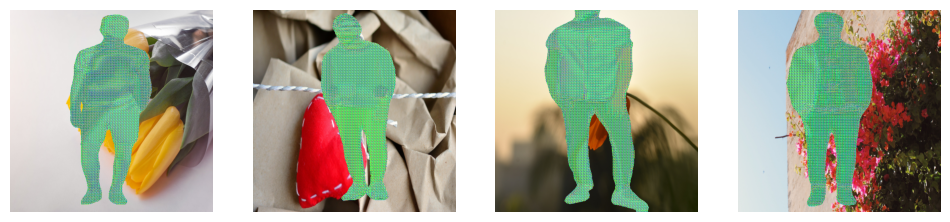

Step [6/323]:
Keypoints detected for image 0: (1, 2)
Keypoints detected for image 1: (4, 2)
Keypoints detected for image 2: (2, 2)
Keypoints detected for image 3: (4, 2)
Keypoints detected for image 4: (1, 2)
Keypoints detected for image 5: (1, 2)
Keypoints detected for image 6: (1, 2)
Keypoints detected for image 7: (1, 2)
Generated pose heatmaps.
D Loss: 0.6404
G Loss: 3.8148


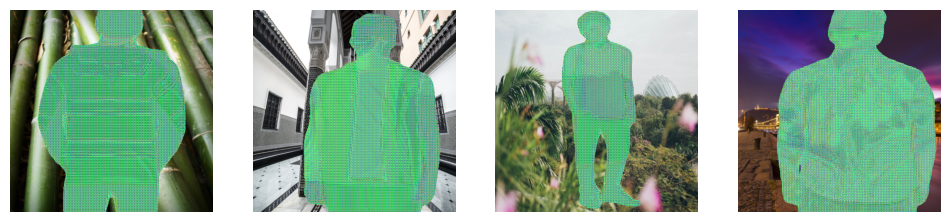

Step [7/323]:
Keypoints detected for image 0: (1, 2)
Keypoints detected for image 1: (1, 2)
Keypoints detected for image 2: (1, 2)
Keypoints detected for image 3: (5, 2)
Keypoints detected for image 4: (2, 2)
Keypoints detected for image 5: (3, 2)
Keypoints detected for image 6: (3, 2)
Keypoints detected for image 7: (1, 2)
Generated pose heatmaps.
D Loss: 0.6418
G Loss: 3.8745


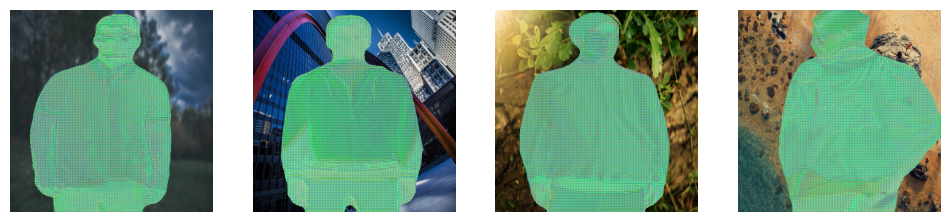

KeyboardInterrupt: 

In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import transforms
from torchvision.models.segmentation import deeplabv3_resnet50
from torchvision.models.detection import keypointrcnn_resnet50_fpn
from torchvision.models import vgg19
from torchvision.transforms.functional import affine
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from torch.utils.data import Subset
import random


# Dataset for clothing, model, and background images
class FashionDataset(Dataset):
    def __init__(self, clothing_dir, model_dir, background_dir, transform=None):
        self.clothing_images = sorted(os.listdir(clothing_dir))
        self.model_images = sorted(os.listdir(model_dir))
        self.background_images = sorted(os.listdir(background_dir))
        self.clothing_dir = clothing_dir
        self.model_dir = model_dir
        self.background_dir = background_dir
        self.transform = transform

    def __len__(self):
        return len(self.clothing_images)

    def __getitem__(self, idx):
        clothing = Image.open(os.path.join(self.clothing_dir, self.clothing_images[idx])).convert("RGB")
        model = Image.open(os.path.join(self.model_dir, self.model_images[idx % len(self.model_images)])).convert("RGB")
        background = Image.open(os.path.join(self.background_dir, self.background_images[idx % len(self.background_images)])).convert("RGB")

        if self.transform:
            clothing = self.transform(clothing)
            model = self.transform(model)
            background = self.transform(background)

        return clothing, model, background


# Generator: Enhanced U-Net-based architecture
class EnhancedGenerator(nn.Module):
    def __init__(self):
        super(EnhancedGenerator, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(26, 64, kernel_size=4, stride=2, padding=1),  # Updated input channels to 26
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1),
            nn.Tanh(),
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x


class PatchDiscriminator(nn.Module):
    def __init__(self):
        super(PatchDiscriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(26, 64, kernel_size=4, stride=2, padding=1),  # Updated input channels to 26
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 1, kernel_size=4, stride=1, padding=0),
            nn.Sigmoid(),
        )

    def forward(self, x):
        return self.model(x)



# Load pretrained DeepLabV3 for segmentation mask generation
segmentation_model = deeplabv3_resnet50(pretrained=True).eval()

# Load pretrained Keypoint R-CNN for pose estimation
pose_model = keypointrcnn_resnet50_fpn(pretrained=True).eval()


def generate_torso_mask(image):
    """
    Extract the torso region using a pre-trained segmentation model.
    """
    with torch.no_grad():
        output = segmentation_model(image)['out']
        torso_mask = ((output.argmax(dim=1, keepdim=True) == 15).float())  # Torso class
    return torso_mask


def generate_pose_heatmaps(images, device):
    """
    Generate pose keypoints heatmaps using a pose estimation model.
    Args:
        images: A batch of images (shape: [B, C, H, W]).
        device: The device (CPU or CUDA) to run the pose estimation model.
    Returns:
        A tensor of heatmaps for all images in the batch (shape: [B, 17, H, W]).
    """
    batch_size, _, height, width = images.shape
    heatmaps_batch = []

    # Process each image independently
    for i in range(batch_size):
        image = images[i].unsqueeze(0)  # Extract the i-th image and add a batch dimension
        image_list = [image.squeeze(0).to(device)]  # Convert to list of 3D tensors
        with torch.no_grad():
            detections = pose_model(image_list)

            # Check if keypoints are detected
            if len(detections[0]['keypoints']) == 0:
                print(f"No keypoints detected for image {i}. Creating empty heatmaps.")
                heatmaps = np.zeros((17, height, width))  # Empty heatmaps
            else:
                keypoints = detections[0]['keypoints'][:, 0, :2].cpu().numpy()  # Extract the first set of (x, y)
                print(f"Keypoints detected for image {i}: {keypoints.shape}")

                # Ensure only 17 keypoints are processed
                keypoints = keypoints[:17]  # Limit to the first 17 keypoints
                heatmaps = np.zeros((17, height, width))  # 17 keypoints
                for j, (x, y) in enumerate(keypoints):
                    if 0 <= int(y) < height and 0 <= int(x) < width:
                        heatmaps[j, int(y), int(x)] = 1

        # Append the heatmaps for this image
        heatmaps_batch.append(torch.tensor(heatmaps).unsqueeze(0))

    # Stack all heatmaps into a single tensor
    heatmaps_batch = torch.cat(heatmaps_batch, dim=0).to(device)  # Shape: [B, 17, H, W]
    print("Generated pose heatmaps.")
    return heatmaps_batch





# Garment warping using spatial transformers
def warp_clothing(clothing, mask):
    """
    Warp the clothing to fit the torso mask dynamically.
    """
    return clothing * mask


# Perceptual Loss using VGG
vgg = vgg19(pretrained=True).features[:16].eval()
for param in vgg.parameters():
    param.requires_grad = False


def perceptual_loss(fake, real):
    fake_features = vgg(fake)
    real_features = vgg(real)
    loss = nn.MSELoss()(fake_features, real_features)
    return loss


# Blending function
def blend_with_background(foreground, background, mask):
    """
    Blend the generated foreground with the background using a binary mask.
    """
    return mask * foreground + (1 - mask) * background


# Training loop
def train_gan(generator, discriminator, dataloader, epochs, device):
    generator = generator.to(device)
    discriminator = discriminator.to(device)
    segmentation_model.to(device)
    pose_model.to(device)
    vgg.to(device)

    opt_gen = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
    opt_disc = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))
    bce_loss = nn.BCELoss()

    print("Training started...")

    for epoch in range(epochs):
        print(f"\nEpoch [{epoch+1}/{epochs}]")
        for i, (clothing, model, background) in enumerate(dataloader):
            print(f"Step [{i+1}/{len(dataloader)}]:")
            # Step 1: Load Data
            clothing = clothing.to(device).float()
            model = model.to(device).float()
            background = background.to(device).float()

            # Step 2: Generate torso mask and pose heatmaps
            torso_mask = generate_torso_mask(model).float()
            pose_heatmaps = generate_pose_heatmaps(model, device).float()

            # Step 3: Warp clothing
            warped_clothing = warp_clothing(clothing, torso_mask).float()

            # Step 4: Prepare input tensor
            torso_mask_3ch = torch.cat([torso_mask, torso_mask, torso_mask], dim=1).float()
            input_tensor = torch.cat([warped_clothing, model, torso_mask_3ch, pose_heatmaps], dim=1).float()

            # Step 5: Generate foreground
            fake_foreground = generator(input_tensor)

            # Step 6: Blend with background
            blended_output = blend_with_background(fake_foreground, background, torso_mask)


            real_input = torch.cat([clothing, model, background, pose_heatmaps], dim=1).float()
            fake_input = torch.cat([warped_clothing, blended_output, background, pose_heatmaps], dim=1).float()

            real_preds = discriminator(real_input)
            fake_preds = discriminator(fake_input.detach())

            real_loss = bce_loss(real_preds, torch.ones_like(real_preds))
            fake_loss = bce_loss(fake_preds, torch.zeros_like(fake_preds))
            d_loss = (real_loss + fake_loss) / 2
            print(f"D Loss: {d_loss.item():.4f}")

            opt_disc.zero_grad()
            d_loss.backward()
            opt_disc.step()

            # Train Generator
            fake_preds = discriminator(fake_input)
            g_loss_adv = bce_loss(fake_preds, torch.ones_like(fake_preds))
            g_loss_percep = perceptual_loss(fake_foreground, model)
            g_loss = g_loss_adv + 0.5 * g_loss_percep
            print(f"G Loss: {g_loss.item():.4f}")

            opt_gen.zero_grad()
            g_loss.backward()
            opt_gen.step()

            with torch.no_grad():
                sample = blended_output[:4].cpu()  # Select 4 examples
                sample = (sample * 0.5 + 0.5).permute(0, 2, 3, 1).numpy()  # Unnormalize and transpose

                # Plot samples
                fig, axes = plt.subplots(1, 4, figsize=(12, 4))
                for ax, img in zip(axes, sample):
                    ax.imshow(img)
                    ax.axis("off")
                plt.show()

        # Display sample outputs every 5 epochs
        if True:
            with torch.no_grad():
                sample = blended_output[:4].cpu()  # Select 4 examples
                sample = (sample * 0.5 + 0.5).permute(0, 2, 3, 1).numpy()  # Unnormalize and transpose

                # Plot samples
                fig, axes = plt.subplots(1, 4, figsize=(12, 4))
                for ax, img in zip(axes, sample):
                    ax.imshow(img)
                    ax.axis("off")
                plt.show()

    # Save the trained generator
    torch.save(generator.state_dict(), "enhanced_generator_with_pose.pth")
    print("Training complete. Model saved as enhanced_generator_with_pose.pth.")


# Main function
def main():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    transform = transforms.Compose([
        transforms.Resize((512, 512)),  # High resolution
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
    ])

    dataset = FashionDataset(
        clothing_dir="/content/drive/MyDrive/MLProject/dress/",
        model_dir="/content/drive/MyDrive/MLProject/models/",
        background_dir="/content/drive/MyDrive/MLProject/bg/",
        transform=transform,
    )
    dataset_size = len(dataset)
    subset_size = int(dataset_size * 0.3)  # Use 50% of the data
    indices = random.sample(range(dataset_size), subset_size)
    subset = Subset(dataset, indices)
    dataloader = DataLoader(dataset, batch_size=8, shuffle=True)

    generator = EnhancedGenerator()
    discriminator = PatchDiscriminator()

    train_gan(generator, discriminator, dataloader, epochs=100, device=device)


if __name__ == "__main__":
    main()


In [ ]:
# Update sympy and install torchvision
!pip install sympy --upgrade
!pip install torchvision==0.15.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.2/6.2 MB 54.3 MB/s eta 0:00:00
  Attempting uninstall: sympy
    Found existing installation: sympy 1.13.1
    Uninstalling sympy-1.13.1:
      Successfully uninstalled sympy-1.13.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torch 2.5.1+cu121 requires sympy==1.13.1; python_version >= "3.9", but you have sympy 1.13.3 which is incompatible.


INFO: pip is looking at multiple versions of torchvision to determine which version is compatible with other requirements. This could take a while.
ERROR: Could not find a version that satisfies the requirement torch==2.0.0+cu117 (from torchvision) (from versions: 1.11.0, 1.12.0, 1.12.1, 1.13.0, 1.13.1, 2.0.0, 2.0.1, 2.1.0, 2.1.1, 2.1.2, 2.2.0, 2.2.1, 2.2.2, 2.3.0, 2.3.1, 2.4.0, 2.4.1, 2.5.0, 2.5.1)
ERROR: No matching distribution found for torch==2.0.0+cu117
